# 미세먼지를 포함한 날씨에 따른 서울시 공공자전거(따릉이) 이용량 예측

- 2017년 1월 1일 00시 ~ 2019년 5월 31일 23시 데이터 사용
    - 독립변수(16개, Row: 20923)
        - 대기오염도: `오존`, `미세먼지`, 이산화질소, 일산화탄소, 이산화황, 초미세먼지
        - 기상: `기온`, `강수량(카테고리)`, `강설량(카테고리)`, `기압`, `습도`, 풍속, 풍향
        - 시간 카테고리: `시간(0~24h)`, `평일/공휴일`
        - `서울시 공공자전거 공급량`
    - 종속변수
        - `서울시 공공자전거 이용량`

![아키텍쳐](../img/architecture.jpeg)

### 목표 성능값: $R^2 = 0.7$
- 근거: 이장호, 정경옥, 신희철(2016), 기상조건과 입지특성이 공공자전거 이용에 미치는 영향 분석 => $R^2 = 0.635$

### 최종 모델 성능: $R^2 = 0.847$
$log(이용량) \sim C(시간):C(평일/공휴일) + scale(기온) + scale(기온^2) + scale(기온^4) + C(강수량 카테고리) + C(강설량 카테고리)$

$+ scale(기압) + scale(습도) + scale(오존) + scale(오존^2) + scale(log(미세먼지)) + scale(log(미세먼지))^2) + scale(log(공공자전거공급량))$

In [124]:
ls = []
ls.append(pd.DataFrame({"name" : "선형회귀", "$R^2$" : score2.iloc[1, :5]}))
ls.append(pd.DataFrame({"name" : "비선형회귀", "$R^2$" : score3.iloc[1, :5]}))
ls.append(pd.DataFrame({"name" : "강수량/강설량 카테고리", "$R^2$" : score4.iloc[1, :5]}))
ls.append(pd.DataFrame({"name" : "log(종속변수)", "$R^2$" : score5.iloc[1, :5]}))
score_df = pd.concat(ls)

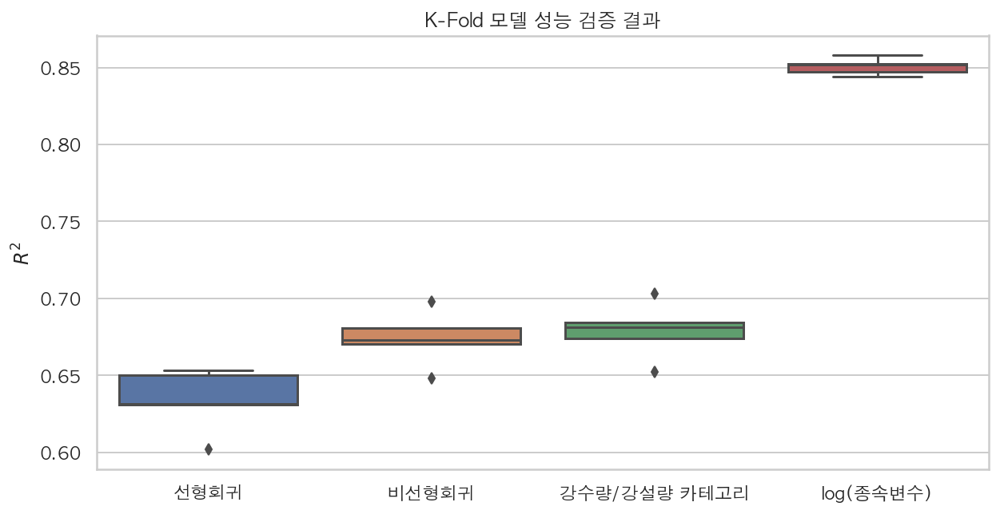

In [125]:
## 성능 개선 Box plot
plt.figure(figsize = (10, 5))
plt.rc('font', family="AppleGothic")
plt.rc('figure', dpi=300)
sns.boxplot(x="name", y="$R^2$", data=score_df)
plt.title("K-Fold 모델 성능 검증 결과")
plt.xlabel("")
plt.show()

# 0. 목차

- 데이터 전처리
    - 기상데이터
    - 대기오염도
    - 자전거 공급대수


- 독립변수와 종속변수 분석
    - 독립변수간 상관관계
    - 독립변수와 종속변수 사이 상관관계


- Split Train/Test dataset
    - Random split
    - Time-series split

- Design Linear Regression Model
    - 모델 개선
        - 2차 모형
        - 선형회귀
        - 비선형 회귀
        - 강수량 / 강설량 카테고리화
        - log(종속변수)
    - Test set으로 예측


- Design Linear Regression Model: Time-series split
    - 미세먼지 미포함
    - 미세먼지 포함

- 제언

- 참고문헌

#### import

In [4]:
# plt에 한글 폰트 적용
# mpl.rc("font", family = "AppleGothic")
from IPython.display import Image

# pickle
import pickle

# 날짜 타입 데이터
import datetime

# module
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import pandas as pd
import sklearn as sk

# Linear Regression Model - sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Linear Regression Model - statsmodels 
import statsmodels.api as sm

# dmatrix
from patsy import *

# K-fold
from sklearn.model_selection import KFold

# 1. 데이터 전처리
---
- 최종적으로 2017년 1월 1일 00시 ~ 2019년 5월 31일 23시 데이터를 사용

## 1.1. 기상 데이터 전처리
- 2015년 1월 1일 00시부터 2019년 5월 31일 23시 데이터를 사용

In [2]:
df_weather_2015 = pd.read_csv("../data/raw/weather_hour_2015.csv", encoding = "euc-kr")
df_weather_2016 = pd.read_csv("../data/raw/weather_hour_2016.csv", encoding = "euc-kr")
df_weather_2017 = pd.read_csv("../data/raw/weather_hour_2017.csv", encoding = "euc-kr")
df_weather_2018 = pd.read_csv("../data/raw/weather_hour_2018.csv", encoding = "euc-kr")
df_weather_2019 = pd.read_csv("../data/raw/weather_hour_2019.csv", encoding = "euc-kr")
df_weather = pd.concat([df_weather_2015, df_weather_2016, df_weather_2017, df_weather_2018, df_weather_2019], sort = False)

In [3]:
df_weather["일시"] = df_weather["일시"].astype("datetime64")
df_weather.sort_values(by="일시", inplace = True)
df_weather.reset_index(drop = True, inplace = True)

In [4]:
df_weather.head(2)

,일시,기온(°C),강수량(mm),적설(cm),풍속(m/s),풍향(16방위),습도(%),현지기압(hPa),중하층운량(10분위)
0,2015-01-01 00:00:00,-6.9,NaN,NaN,6.1,290.0,31.0,1011.6,0.0
1,2015-01-01 01:00:00,-7.4,NaN,NaN,4.7,290.0,33.0,1011.8,NaN


### Null Data

In [5]:
print(df_weather.isnull().sum())
print("데이터의 갯수: {}".format(len(df_weather)))

일시                 0
기온(°C)             5
강수량(mm)        35233
적설(cm)         37665
풍속(m/s)           46
풍향(16방위)          46
습도(%)             21
현지기압(hPa)          7
중하층운량(10분위)     3242
dtype: int64
데이터의 갯수: 38665


### 기온 처리: 평균 데이터 사용
- 모든 데이터가 없는 경우, Drop
- 일반적으로 기온은 연속적으로 변하는 데이터이므로, 직전 시간과 직후 시간의 평균을 삽입

In [6]:
df_weather.loc[df_weather["기온(°C)"].isnull()]

,일시,기온(°C),강수량(mm),적설(cm),풍속(m/s),풍향(16방위),습도(%),현지기압(hPa),중하층운량(10분위)
23993,2017-09-26 17:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
24375,2017-10-12 15:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0
24376,2017-10-12 16:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0
24377,2017-10-12 17:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0
34290,2018-11-29 18:00:00,NaN,NaN,NaN,0.9,320.0,46.0,1016.3,8.0


In [7]:
df_weather.loc[34289:34291]

,일시,기온(°C),강수량(mm),적설(cm),풍속(m/s),풍향(16방위),습도(%),현지기압(hPa),중하층운량(10분위)
34289,2018-11-29 17:00:00,5.8,NaN,NaN,1.3,360.0,38.0,1016.0,8.0
34290,2018-11-29 18:00:00,NaN,NaN,NaN,0.9,320.0,46.0,1016.3,8.0
34291,2018-11-29 19:00:00,5.2,NaN,NaN,1.9,340.0,48.0,1016.3,0.0


In [8]:
df_weather.loc[34290, "기온(°C)"] = df_weather.loc[[34289, 34291], "기온(°C)"].mean()

In [9]:
df_weather = df_weather[~df_weather["기온(°C)"].isnull()]

### 강수량 처리: 기후통계지침(2019) p.61
- 1.3.5.4 강수량이 없을 경우에는 공란으로 둔다.
- 1.3.5.5 강수량이 0.1mm 미만이거나 관측할 수 없을 정도의 양은 0000으로 기입한다.
    - 예) 0.1mm → 0001, 13.0mm → 0130, 5.7mm → 0057, 45.6mm → 0456, 123.0mm → 1230, 630.7mm → 6307

### 강설량 처리: 기후통계지침(2019) p.65
- 1.3.19 적설 0.1cm(****) 4자리
    - 1.3.19.2 기입방법은 신적설에 준한다.

- 1.3.18 3시간 최심 신적설 0.1cm(****) 4자리
    - 1.3.18.2 눈이 관측장소(노장)의 1/2이상을 덮고 있으나, 관측할 수 없는 경우에는 0.0cm로 보고 0000으로 기입하고, 관측장소의 1/2미만으로 관측할 수 없거나, 현상이 없을 때 에는 공란으로 둔다.
    - 예) 0.0cm → 0000, 12.8cm → 0128, 0.4cm → 0004, 123.4cm → 1234

In [10]:
# 강수량, 강설량은 0으로 맞춰준다.
df_weather["강수량(mm)"].fillna(value= 0, inplace=True)
df_weather["적설(cm)"].fillna(value= 0, inplace=True)

### 풍속, 풍향 처리: 기후통계지침(2019) p. 60
- 1.3.1 풍향 36위(**) 2자리
    - 1.3.1.1 16방위로 관측된 매시풍향을 [표A-3]에 따라 2자리로 기입한다. 정온(풍속 0.4m/s 이하)일 경우에는 00으로 하고 공란이나 "-"로 하지 않는다. 단, 결측일 때는 풍향, 풍속은 공란 으로 하고 비고란에 결측 사유를 기록한다.(상기 사항은 합계란을 포함, 모든 요소에 공통이다.)

In [11]:
# 풍속, 풍향이 없는 값은 결측치이므로 Drop
df_weather = df_weather[~df_weather["풍속(m/s)"].isnull()]
df_weather = df_weather[~df_weather["풍향(16방위)"].isnull()]

### 습도 처리: Drop
- 습도의 경우 기온의 지수값에 크게 영향을 받는 데이터이므로 섣부르게 평균값 삽입을 할 수 없다.
    - 일정 기간 내에 NaN이 많은 것으로 보아 이 기간동안 관측기기의 문제로 보인다. Drop

In [12]:
df_weather.loc[df_weather["습도(%)"].isnull()]

,일시,기온(°C),강수량(mm),적설(cm),풍속(m/s),풍향(16방위),습도(%),현지기압(hPa),중하층운량(10분위)
29623,2018-05-19 07:00:00,11.4,0.0,0.0,1.4,110.0,NaN,1004.7,0.0
29666,2018-05-21 02:00:00,13.9,0.0,0.0,0.9,90.0,NaN,1009.4,0.0
29667,2018-05-21 03:00:00,13.0,0.0,0.0,0.8,70.0,NaN,1009.3,0.0
29668,2018-05-21 04:00:00,12.4,0.0,0.0,0.8,110.0,NaN,1009.0,0.0
29669,2018-05-21 05:00:00,11.9,0.0,0.0,1.3,90.0,NaN,1009.1,0.0
29670,2018-05-21 06:00:00,11.4,0.0,0.0,0.9,20.0,NaN,1008.9,0.0
29671,2018-05-21 07:00:00,12.3,0.0,0.0,0.9,110.0,NaN,1009.0,0.0
29691,2018-05-22 03:00:00,15.5,0.0,0.0,0.7,50.0,NaN,1005.7,7.0
29692,2018-05-22 04:00:00,15.6,0.0,0.0,0.5,50.0,NaN,1005.5,3.0
29693,2018-05-22 05:00:00,15.7,0.0,0.0,0.6,90.0,NaN,1005.4,4.0


In [13]:
df_weather = df_weather[~df_weather["습도(%)"].isnull()]

### 기압 처리: 평균
- 기압의 경우, 기온과 같이 연속으로 변하는 데이터이므로 평균값을 삽입한다.
    - 기압 데이터의 경우 연속된 두 데이터가 비어있으므로, 비어있는 값을 기준[0]으로 [-3, -2, 2, 3]번째 데이터로 평균

In [14]:
df_weather.loc[df_weather["현지기압(hPa)"].isnull()]

,일시,기온(°C),강수량(mm),적설(cm),풍속(m/s),풍향(16방위),습도(%),현지기압(hPa),중하층운량(10분위)
13999,2016-08-06 07:00:00,27.0,0.0,0.0,1.3,20.0,74.0,NaN,0.0
14000,2016-08-06 08:00:00,28.7,0.0,0.0,1.4,70.0,66.0,NaN,0.0


In [15]:
df_weather.loc[13996:14003]

,일시,기온(°C),강수량(mm),적설(cm),풍속(m/s),풍향(16방위),습도(%),현지기압(hPa),중하층운량(10분위)
13996,2016-08-06 04:00:00,27.6,0.0,0.0,0.8,20.0,75.0,999.5,0.0
13997,2016-08-06 05:00:00,27.0,0.0,0.0,1.3,50.0,76.0,999.5,0.0
13998,2016-08-06 06:00:00,26.7,0.0,0.0,1.6,50.0,77.0,999.5,0.0
13999,2016-08-06 07:00:00,27.0,0.0,0.0,1.3,20.0,74.0,NaN,0.0
14000,2016-08-06 08:00:00,28.7,0.0,0.0,1.4,70.0,66.0,NaN,0.0
14001,2016-08-06 09:00:00,30.4,0.0,0.0,1.6,20.0,59.0,999.2,0.0
14002,2016-08-06 10:00:00,31.9,0.0,0.0,1.3,180.0,60.0,999.0,0.0
14003,2016-08-06 11:00:00,32.6,0.0,0.0,0.7,360.0,55.0,998.7,3.0


In [16]:
df_weather.loc[13999, "현지기압(hPa)"] = round(df_weather.loc[[13996, 13997, 14001, 14002], "현지기압(hPa)"].mean(), 1)
df_weather.loc[14000, "현지기압(hPa)"] = round(df_weather.loc[[13997, 13998, 14002, 14003], "현지기압(hPa)"].mean(), 1)

In [17]:
print(df_weather.isnull().sum())
print("데이터의 갯수: {}".format(len(df_weather)))

일시                0
기온(°C)            0
강수량(mm)           0
적설(cm)            0
풍속(m/s)           0
풍향(16방위)          0
습도(%)             0
현지기압(hPa)         0
중하층운량(10분위)    3240
dtype: int64
데이터의 갯수: 38602


#### 앞선 분석 결과, 중하층운량은 따릉이 이용률에 영향을 주지 않았으므로, Column을 Drop한다.

In [18]:
df_weather.drop(columns="중하층운량(10분위)", inplace=True)

## 1.2. 서울시 시간별 평균 대기오염도 정보 전처리
- 2015년 9월 19일 00시부터 2019년 5월 31일 23시 데이터를 사용
- 25개 관측소에 대해 공간평균을 통해 서울시 전체의 평균 대기오염도를 계산

In [19]:
dust = pd.read_csv("./data/raw/hourly/dust_hour.csv", encoding = "euc-kr")
dust["MSRDT"] = dust["MSRDT"].astype("datetime64")

In [20]:
print(dust.dtypes)
print("데이터의 갯수: {}".format(len(dust)))

MSRDT        datetime64[ns]
MSRSTE_NM            object
NO2                 float64
O3                  float64
CO                  float64
PM10                float64
PM25                float64
SO2                 float64
dtype: object
데이터의 갯수: 809790


In [21]:
print(dust.isnull().sum())
print("데이터의 갯수: {}".format(len(dust)))

MSRDT        0
MSRSTE_NM    0
NO2          0
O3           0
CO           0
PM10         0
PM25         0
SO2          0
dtype: int64
데이터의 갯수: 809790


In [22]:
print(dust[dust == 0].count())
print("데이터의 갯수: {}".format(len(dust)))

MSRDT            0
MSRSTE_NM        0
NO2          16869
O3           19366
CO           18639
PM10         23094
PM25         23288
SO2          17451
dtype: int64
데이터의 갯수: 809790


In [23]:
dust[dust == 0] = np.nan

In [24]:
df_dust = dust.groupby("MSRDT").mean().reset_index()

In [25]:
print(df_dust.isnull().sum())
print("데이터의 갯수: {}".format(len(df_dust)))

MSRDT    0
NO2      0
O3       0
CO       0
PM10     0
PM25     0
SO2      0
dtype: int64
데이터의 갯수: 32409


## 1.3. 날씨 데이터 Merge

In [26]:
len(df_weather), len(df_dust), len(df_weather.loc[0]), len(df_dust.loc[0])

(38602, 32409, 8, 7)

In [27]:
df = pd.merge(df_weather, df_dust, left_on="일시", right_on="MSRDT")
df.drop(columns = ["MSRDT"], inplace = True)

In [28]:
len(df)

32323

In [29]:
rename_dict = {
    '일시': "date",
    '기온(°C)': "Temp",
    '강수량(mm)': "Precipitation",
    '적설(cm)': "Snowfall",
    '풍속(m/s)': "Wind_speed",
    '풍향(16방위)' : "Wind_dir",
    '습도(%)' : "Humidity",
    '현지기압(hPa)' : "Air_pressure",
}
df.rename(columns=rename_dict, inplace = True)

In [30]:
df.head()

,date,Temp,Precipitation,Snowfall,Wind_speed,Wind_dir,Humidity,Air_pressure,NO2,O3,CO,PM10,PM25,SO2
0,2015-09-19 00:00:00,20.2,0.0,0.0,0.8,360.0,60.0,1005.7,0.04804,0.00676,0.464,27.76,14.240000,0.00432
1,2015-09-19 01:00:00,19.5,0.0,0.0,1.2,50.0,63.0,1005.6,0.04312,0.00664,0.460,27.16,15.440000,0.00416
2,2015-09-19 02:00:00,18.8,0.0,0.0,1.3,50.0,67.0,1005.3,0.03816,0.00716,0.444,26.36,15.208333,0.00412
3,2015-09-19 03:00:00,18.1,0.0,0.0,1.3,50.0,70.0,1005.2,0.03512,0.00680,0.444,25.12,14.120000,0.00404
4,2015-09-19 04:00:00,17.5,0.0,0.0,1.8,50.0,74.0,1004.8,0.03412,0.00520,0.452,25.00,13.920000,0.00424


## 1.4. 시간 / 평일-공휴일 데이터 분리

In [ ]:
### Timestamp 제작

df["timestamp"] = df.date.map(datetime.datetime.timestamp)

### 시간 데이터 분리

df["hour"] = df["date"].apply(lambda x : x.hour)

### 주말 및 공휴일 데이터 분리

with open("data/Korea_Holidays_2015_2019.pkl", "rb") as f:
    Korea_Holidays = pickle.load(f)

df["weekday"] = df["date"].apply(lambda date: 0 if date.weekday() >= 5 else 1)
df.loc[df["date"].isin(Korea_Holidays["Holiday"]), "weekday"] = 0

### Timestamp 제작

In [31]:
df["timestamp"] = df.date.map(datetime.datetime.timestamp)

### 시간 데이터 분리

In [32]:
df["hour"] = df["date"].apply(lambda x : x.hour)

### 주말 및 공휴일 데이터 분리

In [33]:
with open("../data/Korea_Holidays_2015_2019.pkl", "rb") as f:
    Korea_Holidays = pickle.load(f)

In [34]:
df["weekday"] = df["date"].apply(lambda date: 0 if date.weekday() >= 5 else 1)
df.loc[df["date"].isin(Korea_Holidays["Holiday"]), "weekday"] = 0

In [35]:
df.head()

,date,Temp,Precipitation,Snowfall,Wind_speed,Wind_dir,Humidity,Air_pressure,NO2,O3,CO,PM10,PM25,SO2,timestamp,hour,weekday
0,2015-09-19 00:00:00,20.2,0.0,0.0,0.8,360.0,60.0,1005.7,0.04804,0.00676,0.464,27.76,14.240000,0.00432,1.442588e+09,0,0
1,2015-09-19 01:00:00,19.5,0.0,0.0,1.2,50.0,63.0,1005.6,0.04312,0.00664,0.460,27.16,15.440000,0.00416,1.442592e+09,1,0
2,2015-09-19 02:00:00,18.8,0.0,0.0,1.3,50.0,67.0,1005.3,0.03816,0.00716,0.444,26.36,15.208333,0.00412,1.442596e+09,2,0
3,2015-09-19 03:00:00,18.1,0.0,0.0,1.3,50.0,70.0,1005.2,0.03512,0.00680,0.444,25.12,14.120000,0.00404,1.442599e+09,3,0
4,2015-09-19 04:00:00,17.5,0.0,0.0,1.8,50.0,74.0,1004.8,0.03412,0.00520,0.452,25.00,13.920000,0.00424,1.442603e+09,4,0


### 데이터 정렬

In [36]:
df = df[[
    "date",
    "timestamp",
    "hour",
    "weekday",
    "Temp",
    "Precipitation",
    "Snowfall",
    "Wind_speed",
    "Wind_dir",
    "Humidity",
    "Air_pressure",
    "NO2",
    "O3",
    "CO",
    "SO2",
    "PM10",
    "PM25",
]]

In [37]:
with open("../data/df_weather_hour.pkl", "wb") as f:
    pickle.dump(df, f)

In [38]:
with open("../data/df_weather_hour.pkl", "rb") as f:
    df_weather = pickle.load(f)

In [39]:
df_weather.head()

,date,timestamp,hour,weekday,Temp,Precipitation,Snowfall,Wind_speed,Wind_dir,Humidity,Air_pressure,NO2,O3,CO,SO2,PM10,PM25
0,2015-09-19 00:00:00,1.442588e+09,0,0,20.2,0.0,0.0,0.8,360.0,60.0,1005.7,0.04804,0.00676,0.464,0.00432,27.76,14.240000
1,2015-09-19 01:00:00,1.442592e+09,1,0,19.5,0.0,0.0,1.2,50.0,63.0,1005.6,0.04312,0.00664,0.460,0.00416,27.16,15.440000
2,2015-09-19 02:00:00,1.442596e+09,2,0,18.8,0.0,0.0,1.3,50.0,67.0,1005.3,0.03816,0.00716,0.444,0.00412,26.36,15.208333
3,2015-09-19 03:00:00,1.442599e+09,3,0,18.1,0.0,0.0,1.3,50.0,70.0,1005.2,0.03512,0.00680,0.444,0.00404,25.12,14.120000
4,2015-09-19 04:00:00,1.442603e+09,4,0,17.5,0.0,0.0,1.8,50.0,74.0,1004.8,0.03412,0.00520,0.452,0.00424,25.00,13.920000


## 1.5. Bicycle
- 2015년 9월 19일부터 2019년 5월 31일까지의 데이터를 사용 (약 2200만건)
- 전처리시 시간이 굉장히 오래걸리니 주의해야함!

In [ ]:
with open("../data/raw/df_bicycle.pkl", "rb") as f:
    df_bicycle = pickle.load(f)

In [ ]:
df_bicycle["time_group"] = pd.to_datetime(df_bicycle['rental_date']).dt.strftime('%Y-%m-%d %H')

In [ ]:
df_bike_hourly = df_bicycle.groupby("time_group")["bicycle_num"].count().reset_index()

In [ ]:
df_bike_hourly["date"] = pd.to_datetime(df_bike_hourly['time_group'], format = "%Y-%m-%d %H")

In [ ]:
df_bike_hourly.drop(columns=["time_group"], inplace = True)

In [ ]:
df_bike_hourly = df_bike_hourly[["date", "bicycle_num"]]

In [ ]:
df_bike_hourly.rename(columns={"bicycle_num" : "bike_count"}, inplace=True)

In [ ]:
with open("../data/raw/df_bicycle.pkl", "wb") as f:
    pickle.dump(df_bicycle, f)

## 1.6 일별 자전거 공급 대수 
- 2017년 1월 1일부터 2019년 7월 1일까지의 데이터를 사용

In [40]:
bike_feed = pd.read_csv("../data/raw/bike_feed.csv")

In [41]:
bike_feed.rename(columns={"일자":"date", "건수":"bike_feed"}, inplace = True)

In [42]:
bike_feed.date = bike_feed.date.astype("datetime64")

In [43]:
bike_feed.head()

,date,bike_feed
0,2017-01-01,3020
1,2017-01-02,3063
2,2017-01-03,3087
3,2017-01-04,3091
4,2017-01-05,3088


In [44]:
ls = []
for idx in range(len(bike_feed)):
    for hour in range(24):
        temp = {"date" : str(bike_feed.loc[idx, "date"])[:10] + " " + str(hour) + ":00", "bike_feed" : bike_feed.loc[idx, "bike_feed"]}
        ls.append(temp)
        
bike_feed = pd.DataFrame(ls)

In [45]:
bike_feed["date"] = pd.to_datetime(bike_feed['date'], format = '%Y-%m-%d %H')

In [46]:
bike_feed.head()

,bike_feed,date
0,3020,2017-01-01 00:00:00
1,3020,2017-01-01 01:00:00
2,3020,2017-01-01 02:00:00
3,3020,2017-01-01 03:00:00
4,3020,2017-01-01 04:00:00


In [47]:
with open("../data/df_bike_feed.pkl", "wb") as f:
    pickle.dump(bike_feed, f)

## 1.7 모든 데이터 concat

In [48]:
with open("../data/df_weather_hour.pkl", "rb") as f:
    df_weather = pickle.load(f)

In [49]:
with open("../data/df_bike_hourly.pkl", "rb") as f:
    df_bike = pickle.load(f)

In [50]:
with open("../data/df_bike_feed.pkl", "rb") as f:
    df_bike_feed = pickle.load(f)

In [51]:
len(df_weather), len(df_bike), len(df_bike_feed)

(32323, 32114, 21840)

In [52]:
df = pd.merge(df_weather, df_bike_feed, on = "date")
df = pd.merge(df, df_bike, on = "date")

In [53]:
df.head(2)
print(len(df))

20923


In [54]:
with open("../data/df.pkl", "wb") as f:
    pickle.dump(df, f)

# 2. 독립변수와 종속변수 분석

In [55]:
with open("../data/df.pkl", "rb") as f:
    df = pickle.load(f)

In [56]:
len(df)

20923

In [ ]:
df.head()

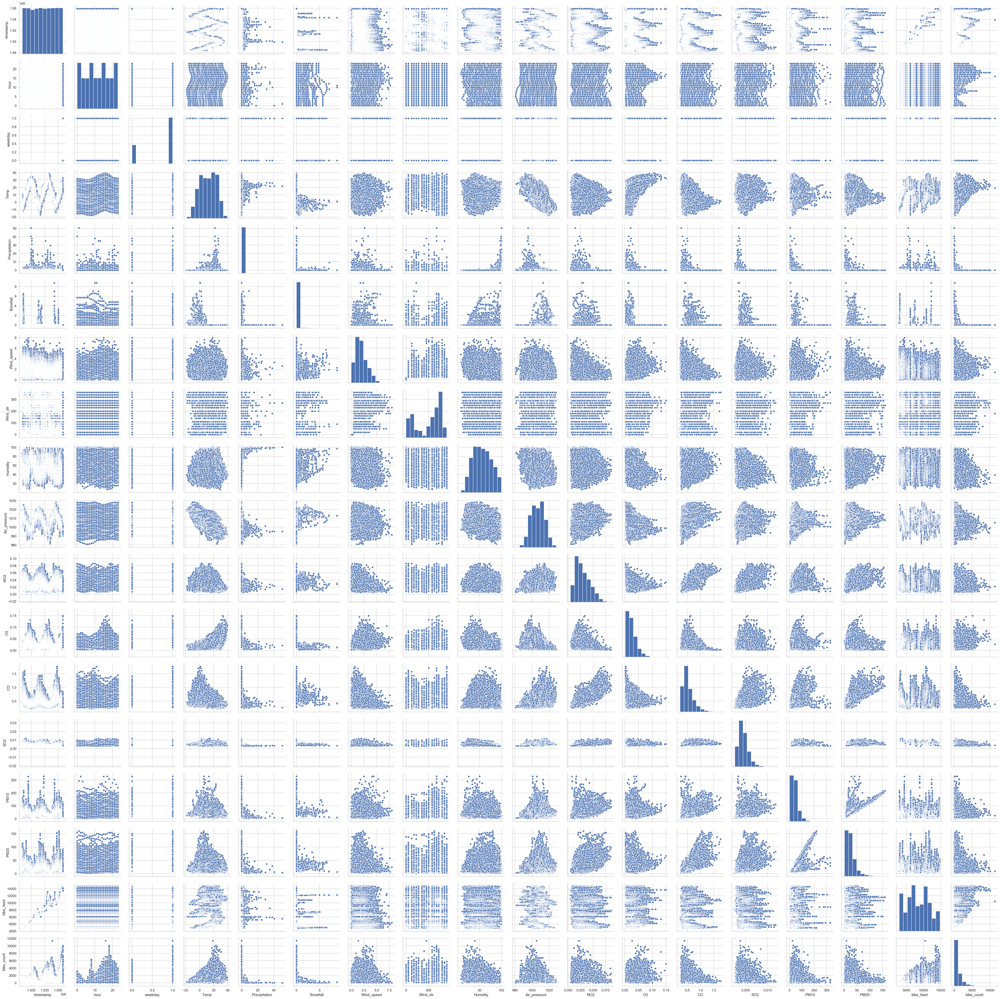

In [58]:
sns.pairplot(df)
plt.show()

In [58]:
df.index = df["date"]
df.drop(columns="date", inplace = True)

### 이상치 제거

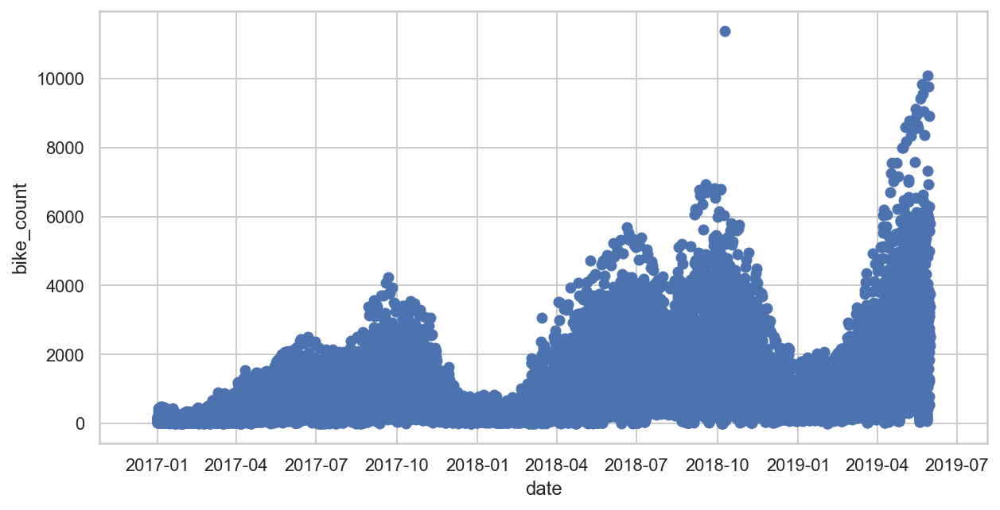

In [59]:
plt.figure(figsize = (10, 5))
plt.scatter(df.index, df["bike_count"])
plt.xlabel("date")
plt.ylabel("bike_count")
plt.show()

### 따릉이 공급량

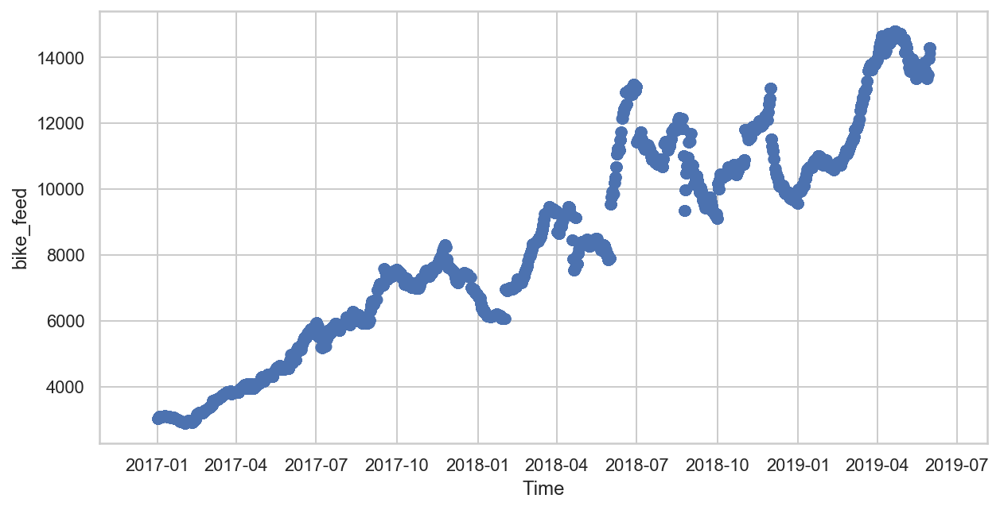

In [60]:
plt.figure(figsize = (10, 5))
plt.scatter(df.index, df["bike_feed"])
plt.xlabel("Time")
plt.ylabel("bike_feed")
plt.show()

- 따릉이 공급량은 시간에 따라 선형적으로 증가하는 추세
- 하지만, 노후화 자전거 교체, 네덜란드 기부 등으로 2018년부터 비선형적인 양상이 크게 나타남. 

In [61]:
df = df[~(df["bike_count"] == df["bike_count"].max())]

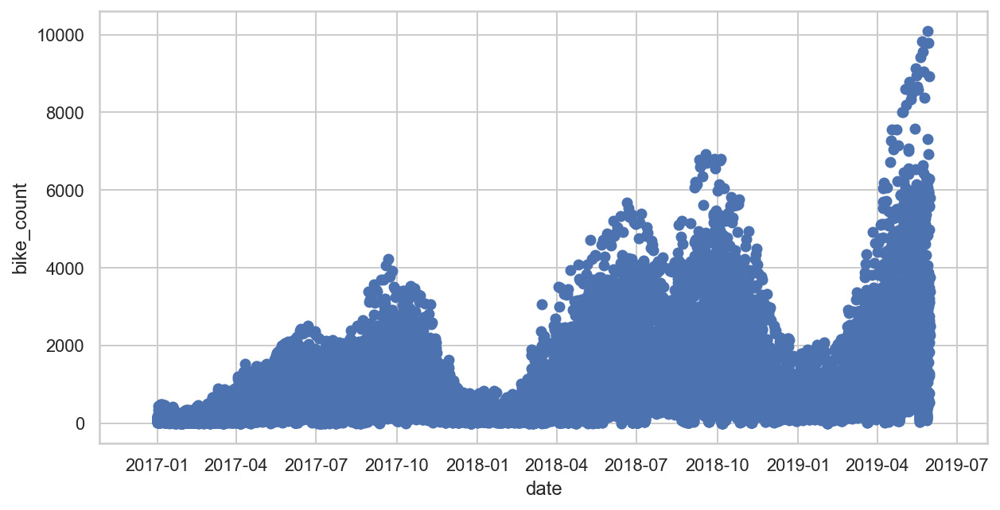

In [62]:
plt.figure(figsize = (10, 5))
plt.scatter(df.index, df["bike_count"])
plt.xlabel("date")
plt.ylabel("bike_count")
plt.show()

## 2-1. 독립변수 사이의 상관관계

### 대기오염도

In [63]:
df_pollution = df[["NO2", "O3", "CO", "SO2", "PM10", "PM25"]]

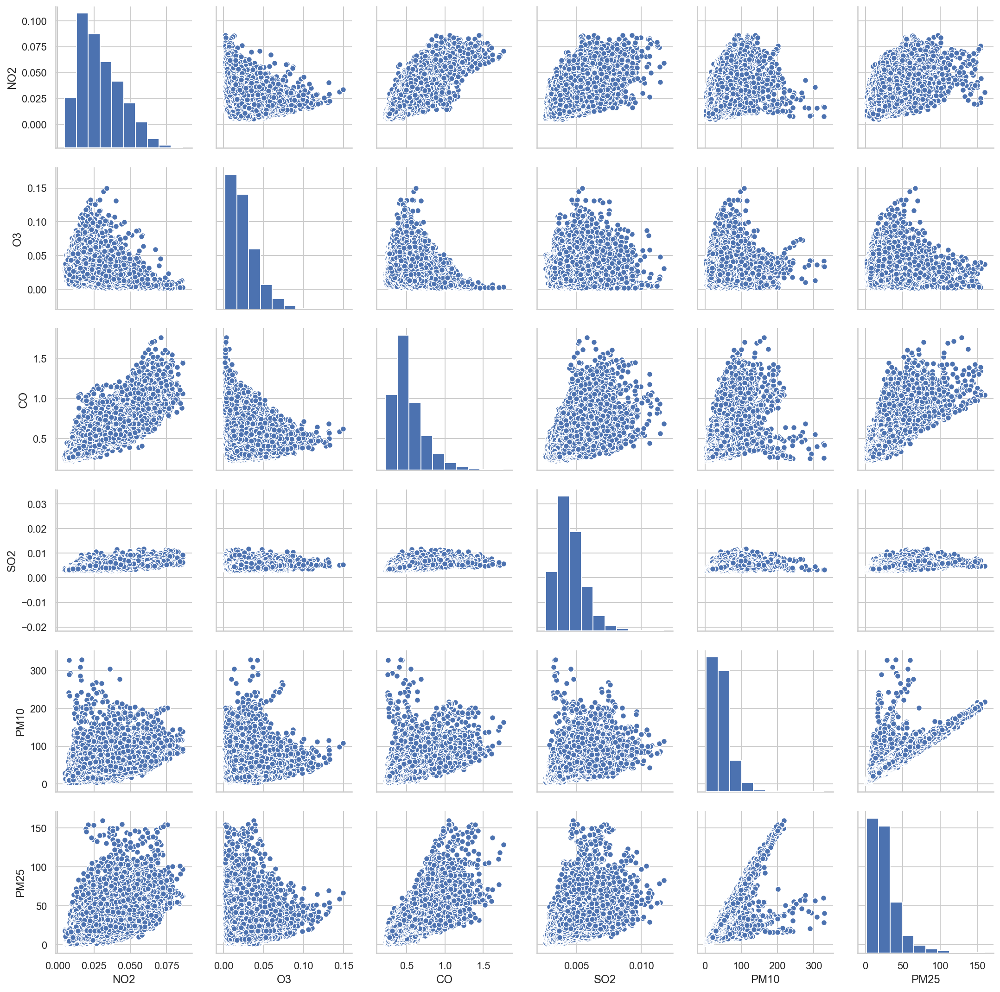

In [64]:
sns.pairplot(df_pollution)
plt.show()

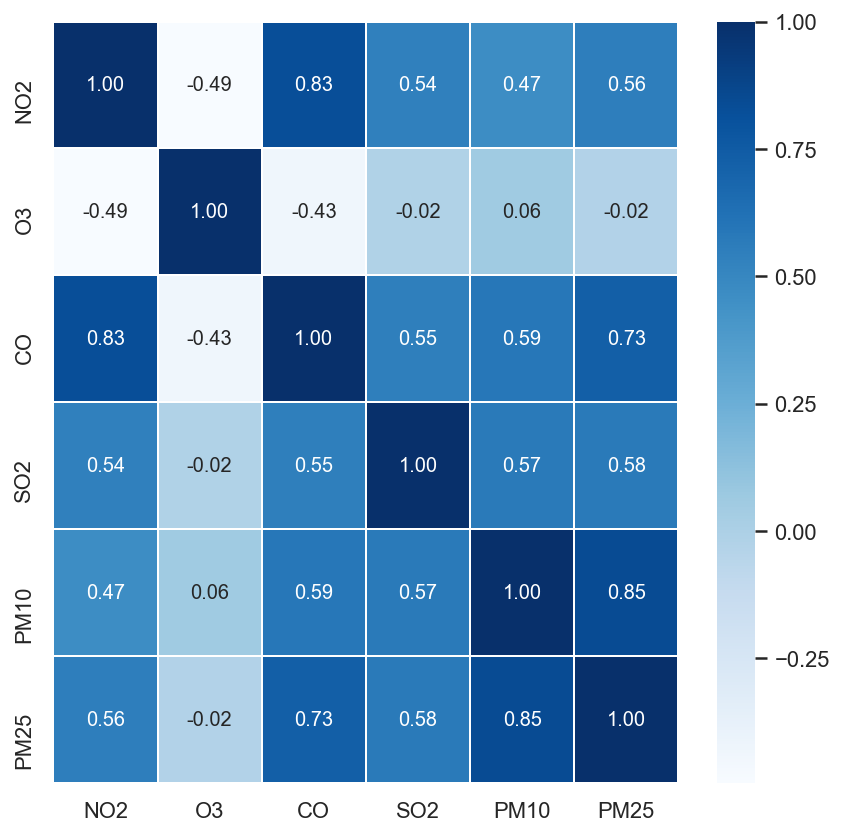

In [65]:
plt.figure(figsize=(7,7))
sns.heatmap(data = df_pollution.corr(), annot=True, fmt = '.2f', linewidths=.5, cmap='Blues')
plt.show()

- 오존을 제외한 다른 오염도끼리에 강한 상관관계가 나타남.
- 다중공선성을 해결하기 위해 PM10과 오존 데이터만 사용하면 좋을 것으로 판단됨.
- PM10을 사용한 이유: PM10은 PM2.5의 영향을 포함하므로.

## 2.2. 독립변수와 종속변수 사이의 상관관계

### 강수량: log? category?

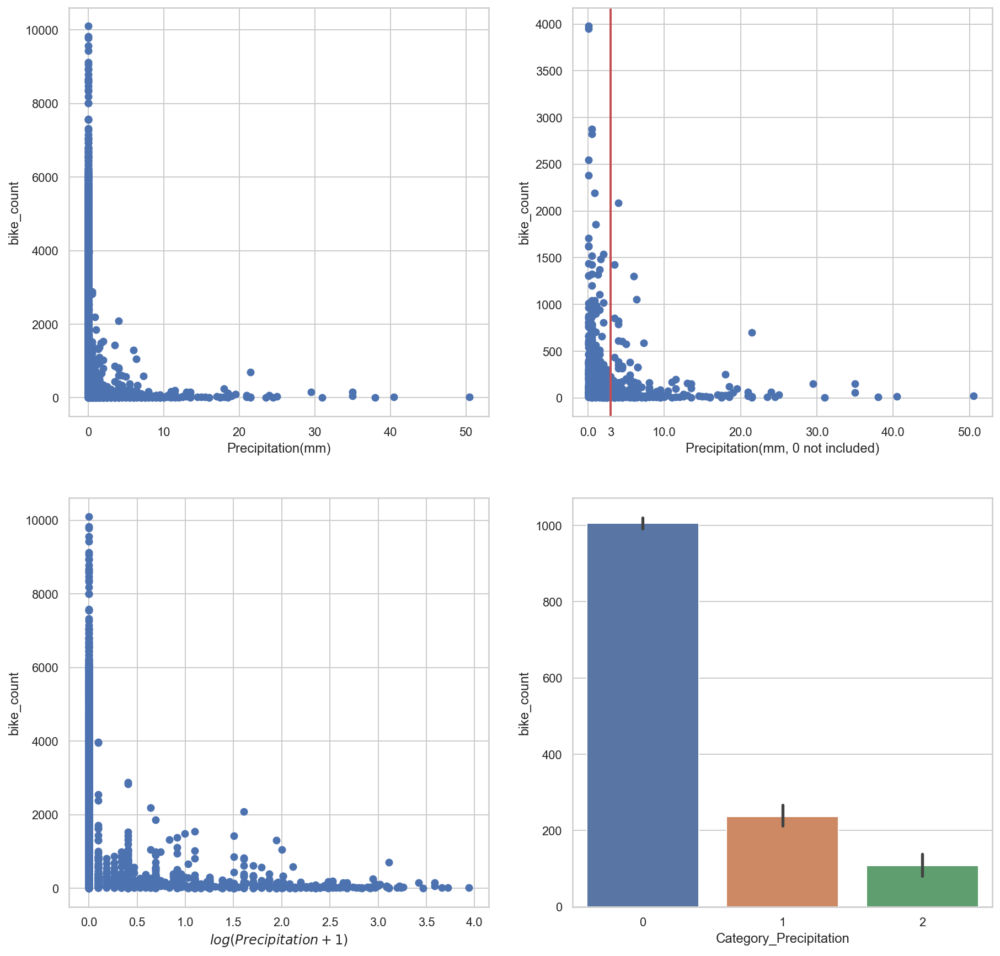

In [66]:
plt.figure(figsize = (15, 15))
plt.subplot(221)
plt.scatter(df["Precipitation"], df["bike_count"])
plt.xlabel("Precipitation(mm)")
plt.ylabel("bike_count")

ax = plt.subplot(222)
plt.scatter(df.loc[df["Precipitation"]!= 0, "Precipitation"], df.loc[df["Precipitation"]!= 0,"bike_count"])
plt.axvline(x=3, lw = 2, color = 'r', label = "3mm")
xt = ax.get_xticks() 
xt = np.append(xt, 3)
xtl=xt.tolist()
xtl[-1]="3"
ax.set_xticks(xt)
ax.set_xticklabels(xtl)
plt.xlabel("Precipitation(mm, 0 not included)")
plt.ylabel("bike_count")
plt.xlim(-2, 53)

plt.subplot(223)
plt.scatter(df["Precipitation"].apply(lambda x : np.log(x+1)), df["bike_count"])
plt.xlabel("$log(Precipitation + 1)$")
plt.ylabel("bike_count")


plt.subplot(224)
temp_df = df.copy()
temp_df["cat_prec"] = temp_df["Precipitation"].apply(lambda x : 0 if x == 0 else 1 if x < 3 else 2)
sns.barplot(x="cat_prec", y="bike_count", data=temp_df)
plt.xlabel("Category_Precipitation")
plt.ylabel("bike_count")
plt.show()

### 강설량: log? category?

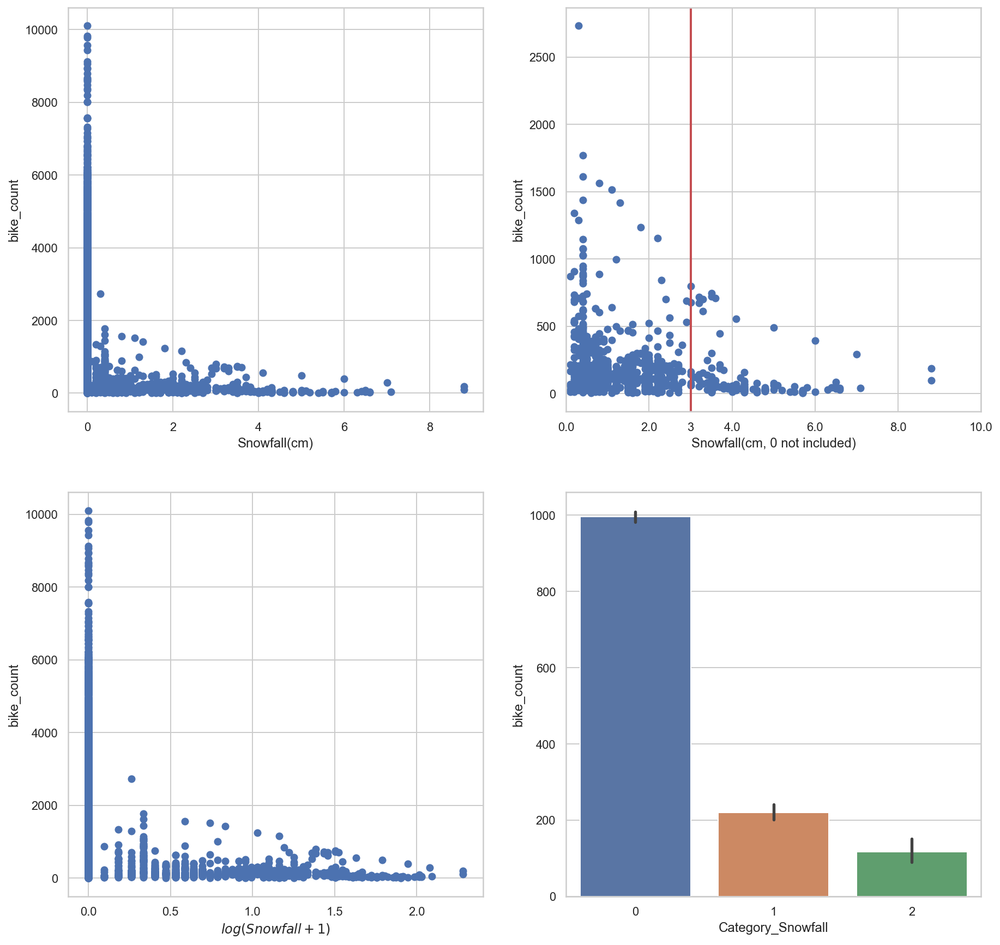

In [67]:
plt.figure(figsize = (15, 15))
plt.subplot(221)
plt.scatter(df["Snowfall"], df["bike_count"])
plt.xlabel("Snowfall(cm)")
plt.ylabel("bike_count")

ax = plt.subplot(222)
plt.scatter(df.loc[df["Snowfall"]!= 0, "Snowfall"], df.loc[df["Snowfall"]!= 0,"bike_count"])
plt.axvline(x=3, lw = 2, color = 'r', label = "3mm")
xt = ax.get_xticks() 
xt = np.append(xt, 3)
xtl=xt.tolist()
xtl[-1]="3"
ax.set_xticks(xt)
ax.set_xticklabels(xtl)
plt.xlabel("Snowfall(cm, 0 not included)")
plt.ylabel("bike_count")
plt.xlim(0, 10)

plt.subplot(223)
plt.scatter(df["Snowfall"].apply(lambda x : np.log(x+1)), df["bike_count"])
plt.xlabel("$log(Snowfall + 1)$")
plt.ylabel("bike_count")


plt.subplot(224)
temp_df = df.copy()
temp_df["cat_snow"] = temp_df["Snowfall"].apply(lambda x : 0 if x == 0 else 1 if x < 3 else 2)
sns.barplot(x="cat_snow", y="bike_count", data=temp_df)
plt.xlabel("Category_Snowfall")
plt.ylabel("bike_count")
plt.show()

#### 카테고리 변수 추가

In [68]:
df["cat_prec"] = df["Precipitation"].apply(lambda x : 0 if x == 0 else 1 if x < 3 else 2)
df["cat_snow"] = df["Snowfall"].apply(lambda x : 0 if x == 0 else 1 if x < 3 else 2)
df["count"] = df["bike_count"]
df.drop(columns="bike_count", inplace=True)
df.rename(columns={"count":"bike_count"}, inplace = True)

### PM10: log(PM10)

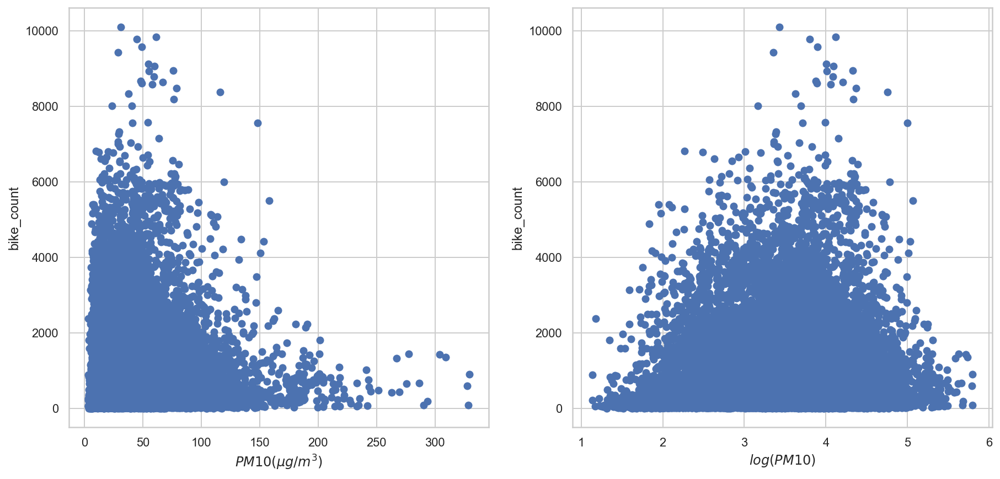

In [69]:
plt.figure(figsize = (15, 7))
plt.subplot(121)
plt.scatter(df["PM10"], df["bike_count"])
plt.xlabel("$PM10(\mu g / m^{3})$")
plt.ylabel("bike_count")

plt.subplot(122)
plt.scatter(df["PM10"].apply(lambda x : np.log(x)), df["bike_count"])
plt.xlabel("$log(PM10)$")
plt.ylabel("bike_count")
plt.show()

### 기온: fat-tail? 4차 다항식?

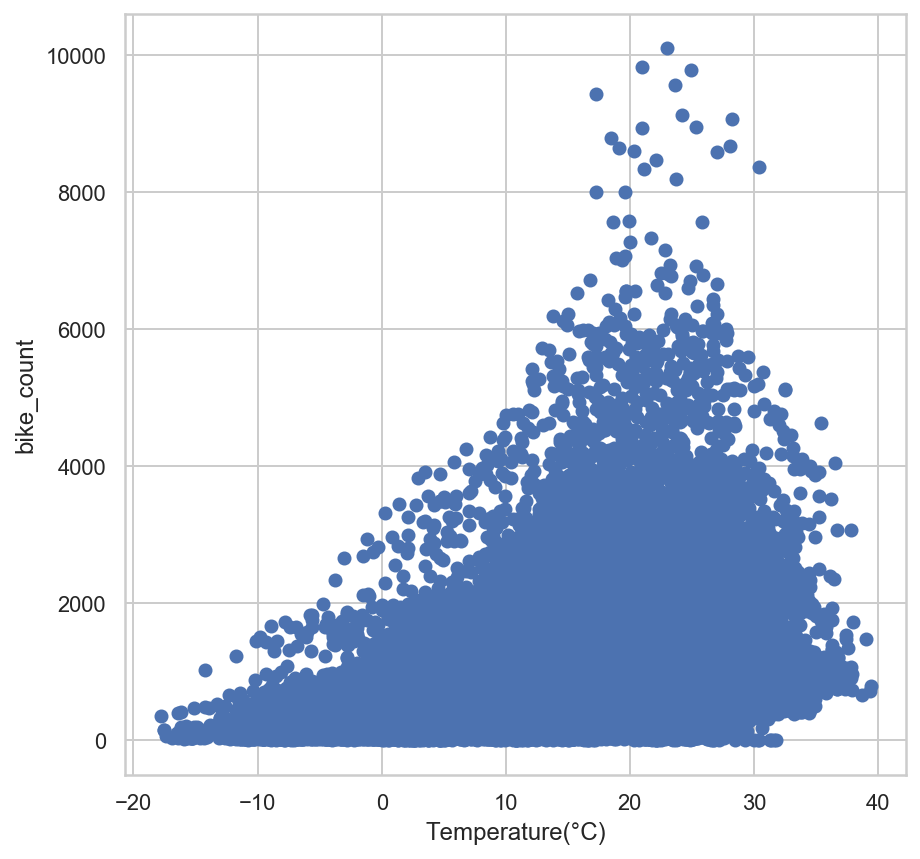

In [70]:
plt.figure(figsize=(7,7))
plt.scatter(df["Temp"], df["bike_count"])
plt.xlabel("Temperature(°C)")
plt.ylabel("bike_count")
plt.show()

# 3. Split train/test dataset

## 3.1. Random split

In [71]:
df.head(2)

,timestamp,hour,weekday,Temp,Precipitation,Snowfall,Wind_speed,Wind_dir,Humidity,Air_pressure,NO2,O3,CO,SO2,PM10,PM25,bike_feed,cat_prec,cat_snow,bike_count
date,,,,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,1.483196e+09,0,0,0.2,0.0,0.0,2.2,20.0,79.0,1018.8,0.05364,0.00250,1.208,0.00536,70.84,52.48,3020,0,0,79
2017-01-01 01:00:00,1.483200e+09,1,0,0.0,0.0,0.0,1.4,20.0,78.0,1018.9,0.05076,0.00248,1.148,0.00532,73.08,51.92,3020,0,0,83


In [72]:
df_train, df_test = train_test_split(df, test_size=0.3, random_state=1)
df_train.shape, df_test.shape

((14645, 20), (6277, 20))

In [73]:
with open("../data/df_train.pkl", "wb") as f:
    pickle.dump(df_train, f)
with open("../data/df_test.pkl", "wb") as f:
    pickle.dump(df_test, f)

## 3.2 Time-series split

In [74]:
len(df)

20922

In [75]:
df_train_timeseries = df.iloc[:round(len(df)*0.5)]
df_val_timeseries = df.iloc[round(len(df)*0.5):round(len(df)*0.7)]
df_test_timeseries = df.iloc[round(len(df)*0.7):]

In [76]:
len(df_train_timeseries), len(df_val_timeseries), len(df_test_timeseries)

(10461, 4184, 6277)

In [77]:
with open("../data/df_train_timeseries.pkl", "wb") as f:
    pickle.dump(df_train_timeseries, f)
with open("../data/df_val_timeseries.pkl", "wb") as f:
    pickle.dump(df_val_timeseries, f)
with open("../data/df_test_timeseries.pkl", "wb") as f:
    pickle.dump(df_test_timeseries, f)

# 4. Design Linear Regression Model: Random split

In [78]:
with open("../data/df_train.pkl", "rb") as f:
    df_train = pickle.load(f)
with open("../data/df_test.pkl", "rb") as f:
    df_test = pickle.load(f)

In [79]:
df_train = sm.add_constant(df_train)
df_test = sm.add_constant(df_test)

## 4.1 K-Fold Function

In [80]:
#df = train dataframe
#formula = formula(string)
#split_number = KFold(`split_number`)
#round_number = 반올림 소숫자릿수
#random_state = 랜덤 스테이트 
#Elastic = Elastic Net 회귀 모형 사용 여부
# return pd.dataframe

def k_fold(df, formula, split_number=5, round_number = 5, random_state=0, Plot = False, Elastic = False, alpha = 0.01, L1_wt = 1):
    
    y_name = df.columns[-1]    
    train_scores = np.zeros(split_number)
    test_scores = np.zeros(split_number)
    
    # KFold 데이터셋 나누기
    cv = KFold(split_number, shuffle=True, random_state=random_state)
    for i, (idx_train, idx_test) in enumerate(cv.split(df)):
        df_train = df.iloc[idx_train]
        df_test = df.iloc[idx_test]

        
        # Train dataset 학습
        model = sm.OLS.from_formula(formula, data=df_train)
        if Elastic:
            result = model.fit_regularized(alpha=alpha, L1_wt=L1_wt)
        else:
            result = model.fit()
            train_scores[i] = round(result.rsquared, round_number)
            
        # Test dataset - Formula dmatrix로 바꾸기
        y_formula = formula.split("~")[0] + "+ 0"
        y_test_formula = dmatrix(y_formula, data = df_test, return_type="dataframe")
        
        # Test dataset calculate R Squared
        pred = result.predict(df_test)
        ess = ((pred - pred.mean()) ** 2).sum()
        tss = ((y_test_formula - y_test_formula.mean())** 2).sum()
        rsquared = ess / tss
        
        test_scores[i] = round(rsquared, round_number)
        
        # 그림을 그려볼까?
        if Plot:
            plt.figure(figsize = (10, 10))
            plt.scatter(y_test_formula, pred)
            plt.plot([0, y_test_formula.max()], [0, y_test_formula.max()], "r", lw=2)
            plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(test_scores[i]), fontsize = 15)
            plt.xlabel("y_test", fontsize = 15)
            plt.ylabel("y_predict", fontsize = 15)
            plt.axis("equal")
            plt.show()
        
        
    if Elastic:
        temp = pd.DataFrame([test_scores], index = ["검증_R2"], columns = range(1, split_number + 1))

    else:
        temp = pd.DataFrame([train_scores, test_scores], index = ["학습_R2", "검증_R2"], columns = range(1, split_number + 1))

    temp["mean"] = round(temp.mean(axis = 1), round_number)
    return temp

## 4.2 Make Default Formula dict

In [81]:
default_formula = list(map(lambda x : "scale({})".format(x), df_train.columns[1:-1]))
default_formula_dict = dict(zip(df_train.columns[1:-1], default_formula))
default_formula_dict["weekday"] = "C(weekday)"
default_formula_dict["hour"] = "C(hour)"
default_formula_dict["Wind_dir"] = "C(Wind_dir)"
default_formula_dict["cat_prec"] = "C(cat_prec)"
default_formula_dict["cat_snow"] = "C(cat_snow)"

In [82]:
default_formula_dict

{'timestamp': 'scale(timestamp)',
 'hour': 'C(hour)',
 'weekday': 'C(weekday)',
 'Temp': 'scale(Temp)',
 'Precipitation': 'scale(Precipitation)',
 'Snowfall': 'scale(Snowfall)',
 'Wind_speed': 'scale(Wind_speed)',
 'Wind_dir': 'C(Wind_dir)',
 'Humidity': 'scale(Humidity)',
 'Air_pressure': 'scale(Air_pressure)',
 'NO2': 'scale(NO2)',
 'O3': 'scale(O3)',
 'CO': 'scale(CO)',
 'SO2': 'scale(SO2)',
 'PM10': 'scale(PM10)',
 'PM25': 'scale(PM25)',
 'bike_feed': 'scale(bike_feed)',
 'cat_prec': 'C(cat_prec)',
 'cat_snow': 'C(cat_snow)'}

## 4.3 모델링

### 4.3.1 1차 검증: 2차 모형

$ y $ ~ $scale(x) + 1$  or $ y $ ~ $C(x) + 1$

In [83]:
cross_r2_ls = []
cross_r2_keys = []
for key, value in default_formula_dict.items():
    formula = "bike_count ~ {}".format(value)
    score = k_fold(df_train, formula)
    cross_r2_ls.append(score.iloc[1, -1])
    cross_r2_keys.append(key)
    
cross_df = pd.DataFrame(data = {"검증_R2" : cross_r2_ls}, index = cross_r2_keys)

In [84]:
cross_df.T[["Wind_speed", "Wind_dir", "hour", "weekday", "Temp", "Precipitation", "cat_prec", "Snowfall", "cat_snow"]]

,Wind_speed,Wind_dir,hour,weekday,Temp,Precipitation,cat_prec,Snowfall,cat_snow
검증_R2,0.007,0.01643,0.24561,0.00129,0.17196,0.00755,0.02607,0.01267,0.01965


In [85]:
cross_df.T[["Humidity", "Air_pressure", "O3", "PM10", "bike_feed", "timestamp"]]

,Humidity,Air_pressure,O3,PM10,bike_feed,timestamp
검증_R2,0.05126,0.04736,0.11865,0.0033,0.21912,0.17049


$ y $ ~ $C(hour):C(weekday) + 1$
- 시간대만 볼 때보다 더 많은 영향을 보인다.

In [86]:
score = k_fold(df_train, "bike_count ~ C(hour):C(weekday) + 1")
score

,1,2,3,4,5,mean
학습_R2,0.28191,0.28011,0.27670,0.27908,0.27287,0.27813
검증_R2,0.28840,0.29349,0.28308,0.25878,0.26722,0.27819


### 4.3.2 선형 모형 제작

In [87]:
# 딕셔너리 초기화
formula_dict = default_formula_dict.copy()

# 딕셔너리 수정
formula_dict["hour:weekday"] = "C(hour):C(weekday)" 

# 사용하고 싶은 키 빼오기
formula_use_keys = ["hour:weekday", "Temp", "Precipitation", "Snowfall", "Air_pressure", "Humidity", "O3", "PM10", "bike_feed"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("bike_count ~ " + " + ".join(formula_use_values))
formula

'bike_count ~ C(hour):C(weekday) + scale(Temp) + scale(Precipitation) + scale(Snowfall) + scale(Air_pressure) + scale(Humidity) + scale(O3) + scale(PM10) + scale(bike_feed)'

#### K-Fold 교차 검증

In [88]:
score2 = k_fold(df_train, formula)
score2

,1,2,3,4,5,mean
학습_R2,0.63720,0.63015,0.63260,0.63086,0.63141,0.63244
검증_R2,0.64994,0.63090,0.65328,0.60164,0.63149,0.63345


### 4.3.3 비선형 모형 제작

In [89]:
# 딕셔너리 초기화
formula_dict = default_formula_dict.copy()

# 딕셔너리 수정
formula_dict["timestamp"] = "scale(timestamp) + scale(I(timestamp**2))" 
formula_dict["hour:weekday"] = "C(hour):C(weekday)" 
formula_dict["Temp"] = "scale(Temp) + scale(Temp**2) + scale(Temp**4)"
formula_dict["Precipitation"] = "scale(np.log(I(Precipitation + 1)))"
formula_dict["Snowfall"] = "scale(np.log(I(Snowfall + 1)))"
formula_dict["O3"] = "scale(O3) + scale(O3**2)"
formula_dict["Air_pressure"] = "scale(Air_pressure)"
formula_dict["PM10"] = "scale(np.log(PM10)) + scale(I(np.log(PM10)**2))"

# 사용하고 싶은 키 빼오기
formula_use_keys = ["hour:weekday", "Temp", "Precipitation", "Snowfall", "Air_pressure", "Humidity", "O3", "PM10", "bike_feed"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("bike_count ~ " + " + ".join(formula_use_values) + "+ 0")
formula

'bike_count ~ C(hour):C(weekday) + scale(Temp) + scale(Temp**2) + scale(Temp**4) + scale(np.log(I(Precipitation + 1))) + scale(np.log(I(Snowfall + 1))) + scale(Air_pressure) + scale(Humidity) + scale(O3) + scale(O3**2) + scale(np.log(PM10)) + scale(I(np.log(PM10)**2)) + scale(bike_feed)+ 0'

#### K-Fold 교차 검증

In [90]:
score3 = k_fold(df_train, formula)
score3

,1,2,3,4,5,mean
학습_R2,0.67685,0.67144,0.67308,0.67118,0.67214,0.67294
검증_R2,0.68080,0.67033,0.69755,0.64776,0.67302,0.67389


#### 

In [91]:
model = sm.OLS.from_formula(formula, data = df_train)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:             bike_count   R-squared:                       0.673
Model:                            OLS   Adj. R-squared:                  0.671
Method:                 Least Squares   F-statistic:                     508.0
Date:                Wed, 10 Jul 2019   Prob (F-statistic):               0.00
Time:                        13:06:17   Log-Likelihood:            -1.1481e+05
No. Observations:               14645   AIC:                         2.297e+05
Df Residuals:                   14585   BIC:                         2.302e+05
Df Model:                          59                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
C(

### 4.3.4 모형 업그레이드: 강수량/강설량 카테고리

In [92]:
# 딕셔너리 초기화
formula_dict = default_formula_dict.copy()

# 딕셔너리 수정
formula_dict["timestamp"] = "scale(timestamp) + scale(I(timestamp**2))" 
formula_dict["hour:weekday"] = "C(hour):C(weekday)" 
formula_dict["Temp"] = "scale(Temp) + scale(Temp**2) + scale(Temp**4)"
formula_dict["Snowfall"] = "scale(np.log(I(Snowfall + 1)))"
formula_dict["O3"] = "scale(O3) + scale(O3**2)"
formula_dict["Air_pressure"] = "scale(Air_pressure)"
formula_dict["PM10"] = "scale(np.log(PM10)) + scale(I(np.log(PM10)**2))"

# 사용하고 싶은 키 빼오기
formula_use_keys = ["hour:weekday", "Temp", "cat_prec", "cat_snow", "Air_pressure", "Humidity", "O3", "PM10", "bike_feed"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("bike_count ~ " + " + ".join(formula_use_values) + "+ 0")
formula

'bike_count ~ C(hour):C(weekday) + scale(Temp) + scale(Temp**2) + scale(Temp**4) + C(cat_prec) + C(cat_snow) + scale(Air_pressure) + scale(Humidity) + scale(O3) + scale(O3**2) + scale(np.log(PM10)) + scale(I(np.log(PM10)**2)) + scale(bike_feed)+ 0'

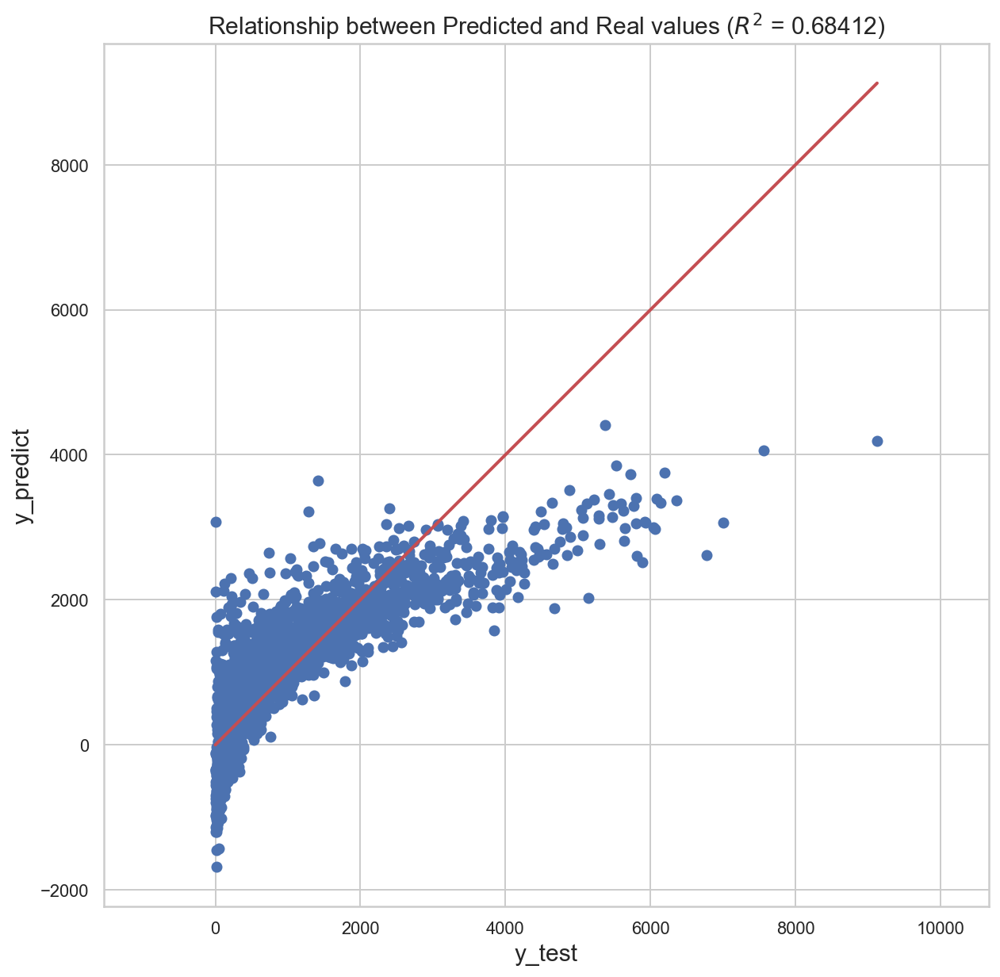

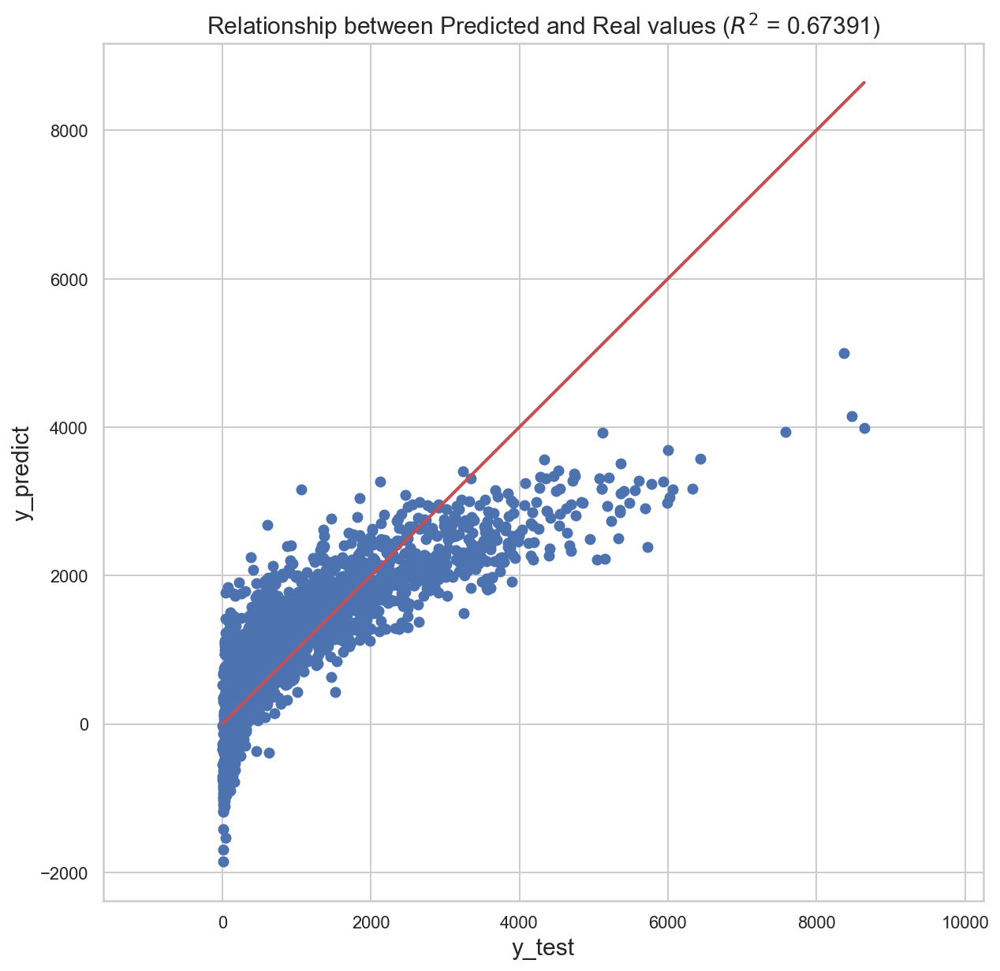

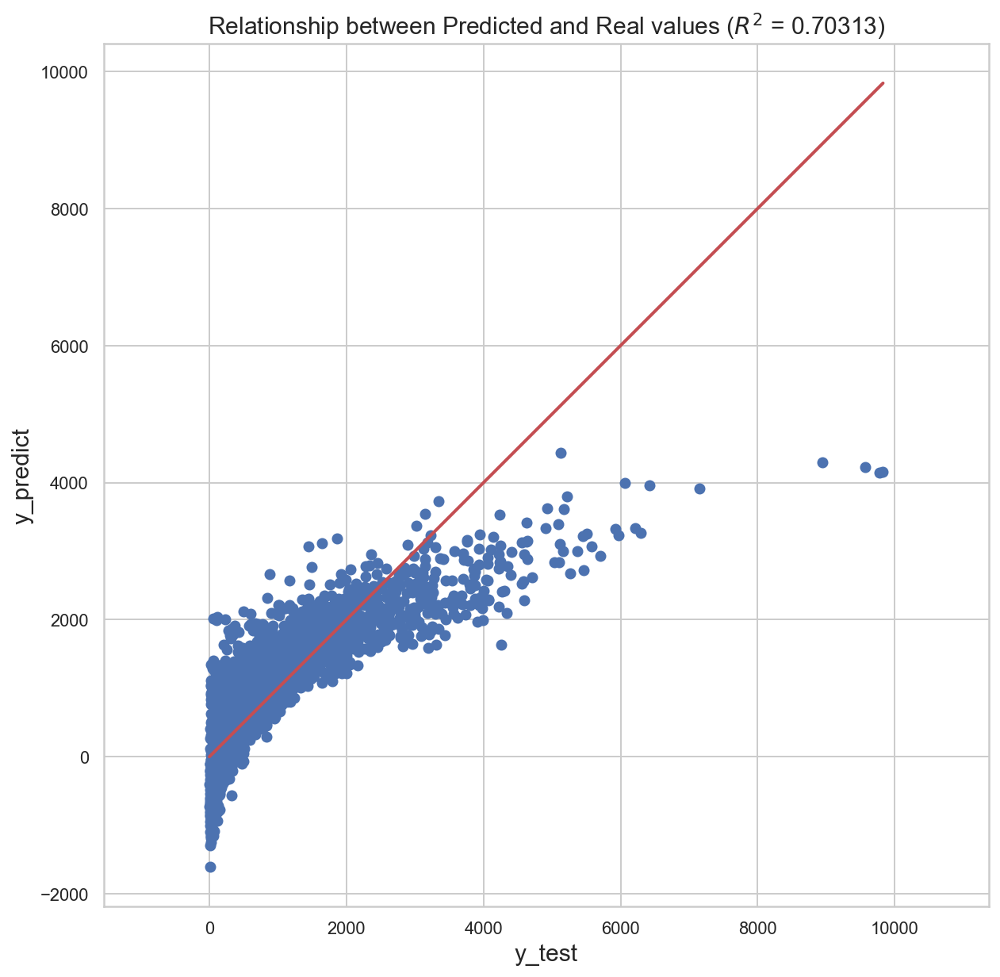

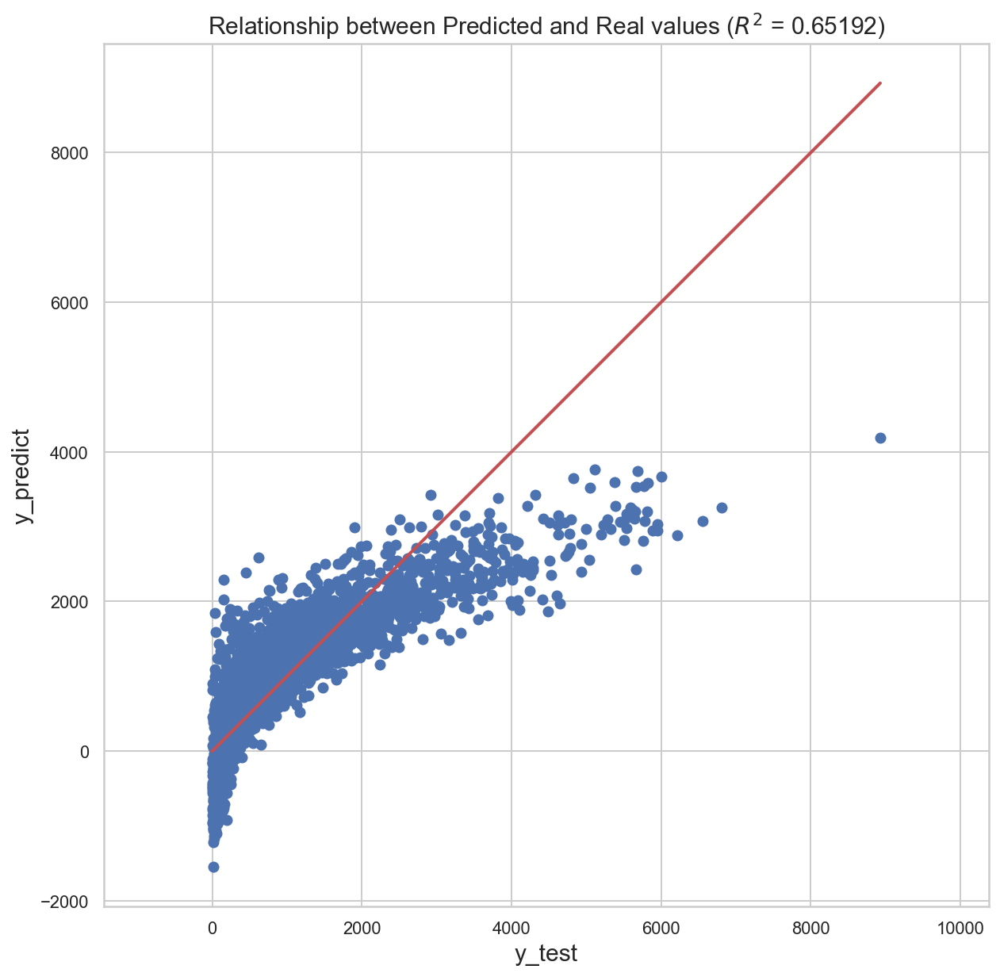

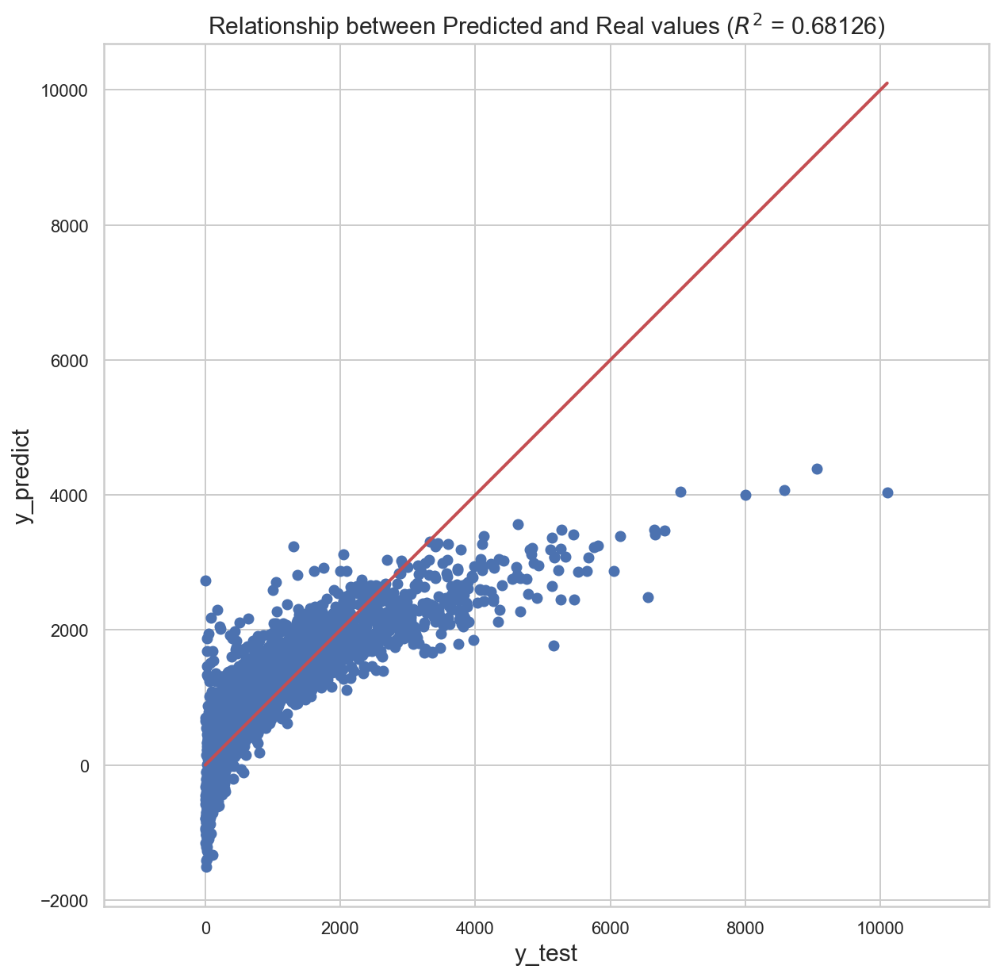

,1,2,3,4,5,mean
학습_R2,0.68153,0.67622,0.67746,0.67615,0.67761,0.67779
검증_R2,0.68412,0.67391,0.70313,0.65192,0.68126,0.67887


In [93]:
score4 = k_fold(df_train, formula, Plot=True)
score4

### 4.3.5 모형 업그레이드: 종속변수 log

In [94]:
# 딕셔너리 초기화
formula_dict = default_formula_dict.copy()

# 딕셔너리 수정
formula_dict["hour:weekday"] = "C(hour):C(weekday)" 
formula_dict["Temp"] = "scale(Temp) + scale(Temp**2) + scale(Temp**4)"
formula_dict["Snowfall"] = "scale(np.log(I(Snowfall + 1)))"
formula_dict["O3"] = "scale(O3) + scale(O3**2)"
formula_dict["Air_pressure"] = "scale(Air_pressure)"
formula_dict["PM10"] = "scale(np.log(PM10)) + scale(I(np.log(PM10)**2))"
formula_dict["bike_feed"] = "np.log(bike_feed)"

# 사용하고 싶은 키 빼오기
formula_use_keys = ["hour:weekday", "Temp", "cat_prec", "cat_snow", "Air_pressure", "Humidity", "O3", "PM10", "bike_feed"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("np.log(bike_count) ~ " + " + ".join(formula_use_values) + "+ 0")
formula

'np.log(bike_count) ~ C(hour):C(weekday) + scale(Temp) + scale(Temp**2) + scale(Temp**4) + C(cat_prec) + C(cat_snow) + scale(Air_pressure) + scale(Humidity) + scale(O3) + scale(O3**2) + scale(np.log(PM10)) + scale(I(np.log(PM10)**2)) + np.log(bike_feed)+ 0'

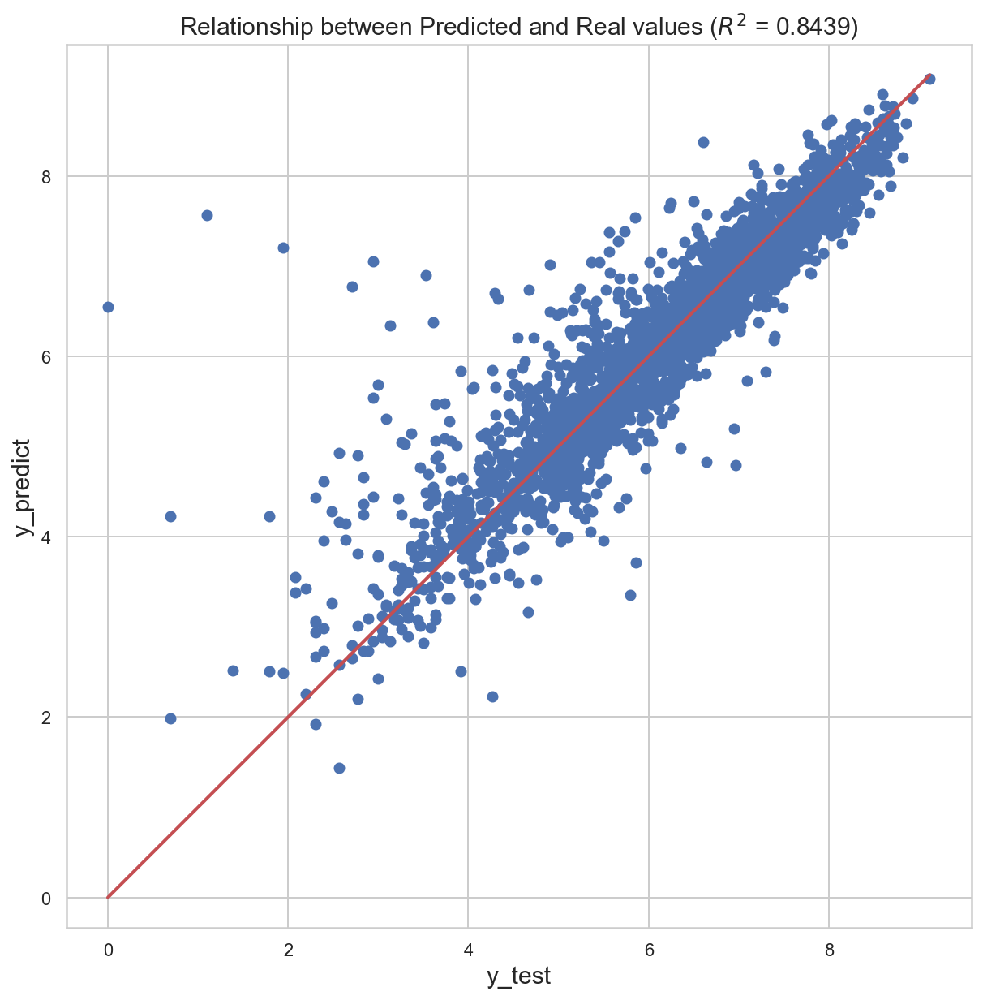

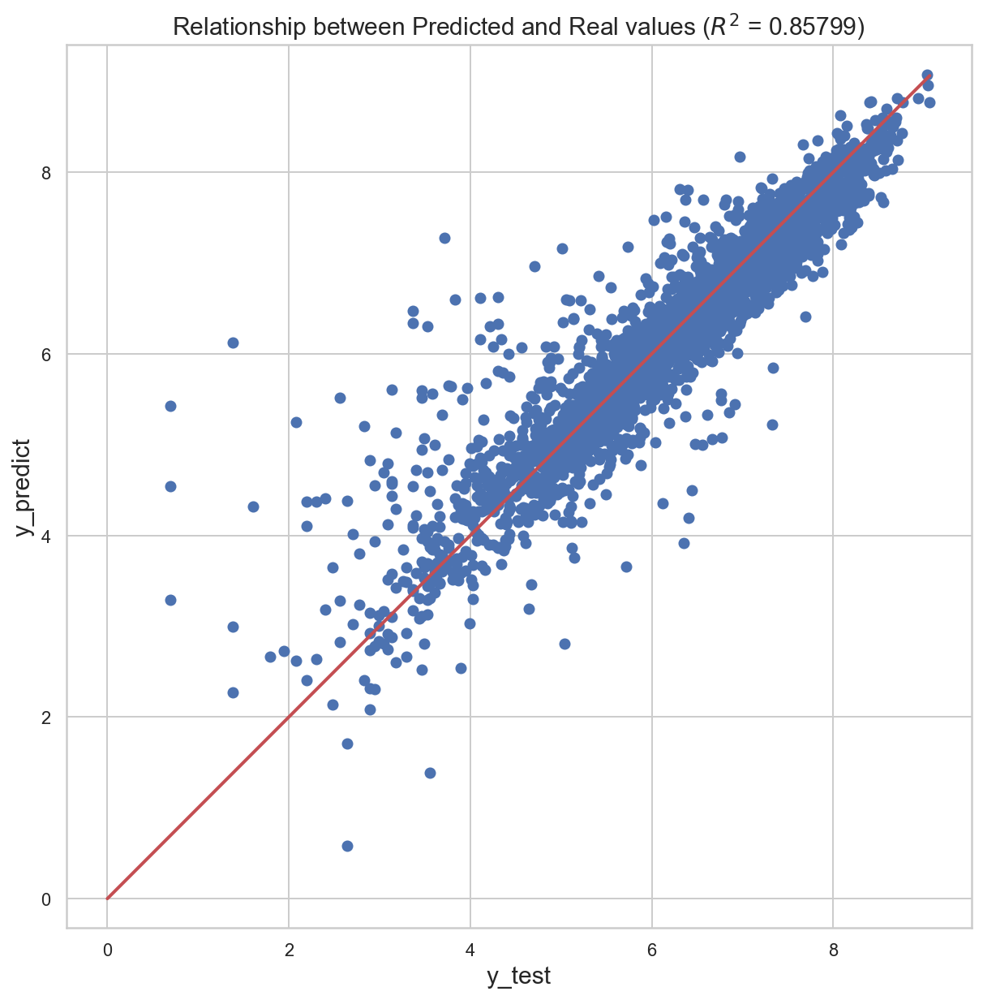

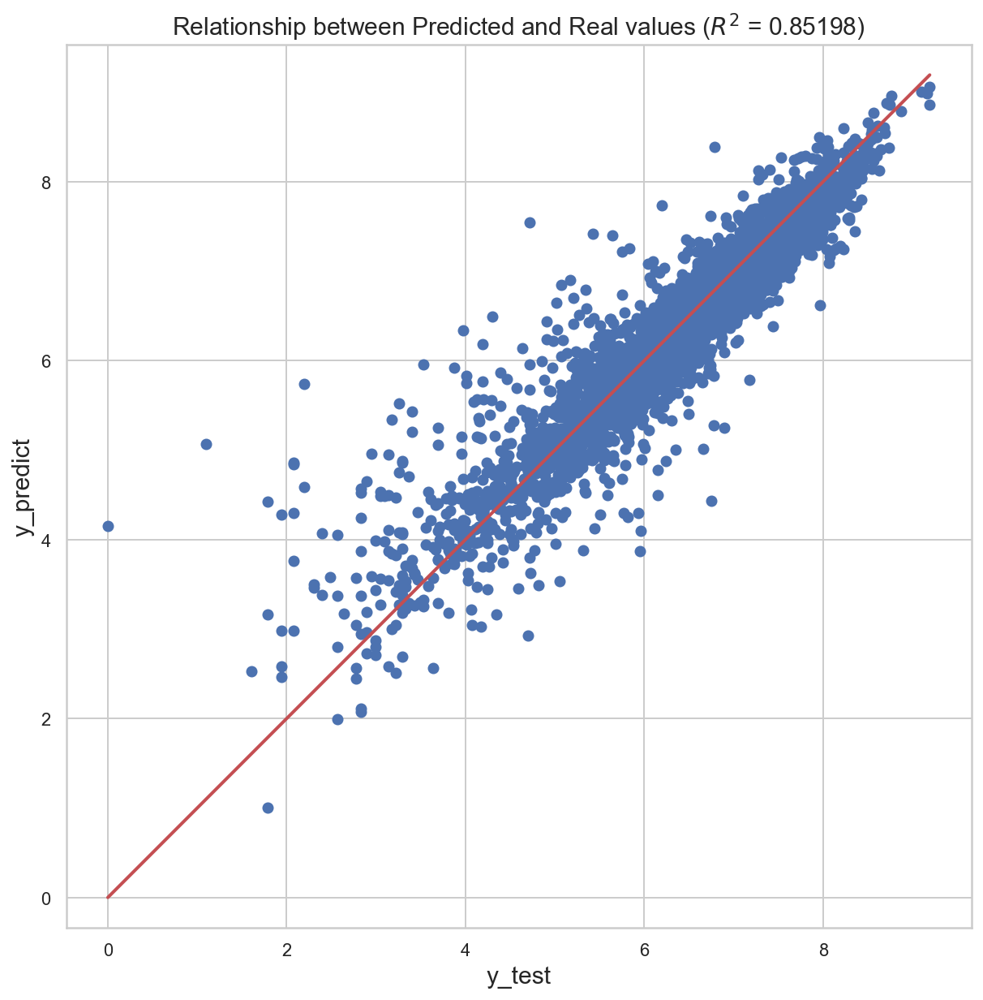

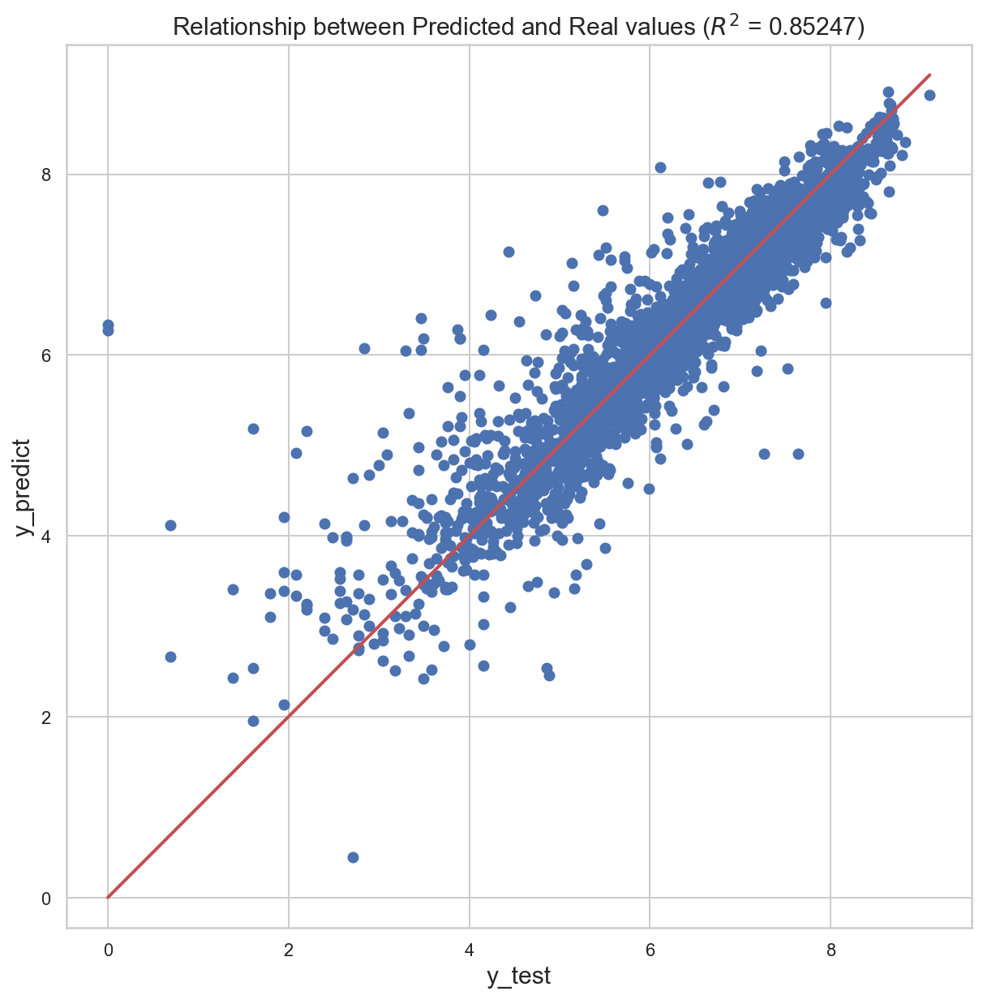

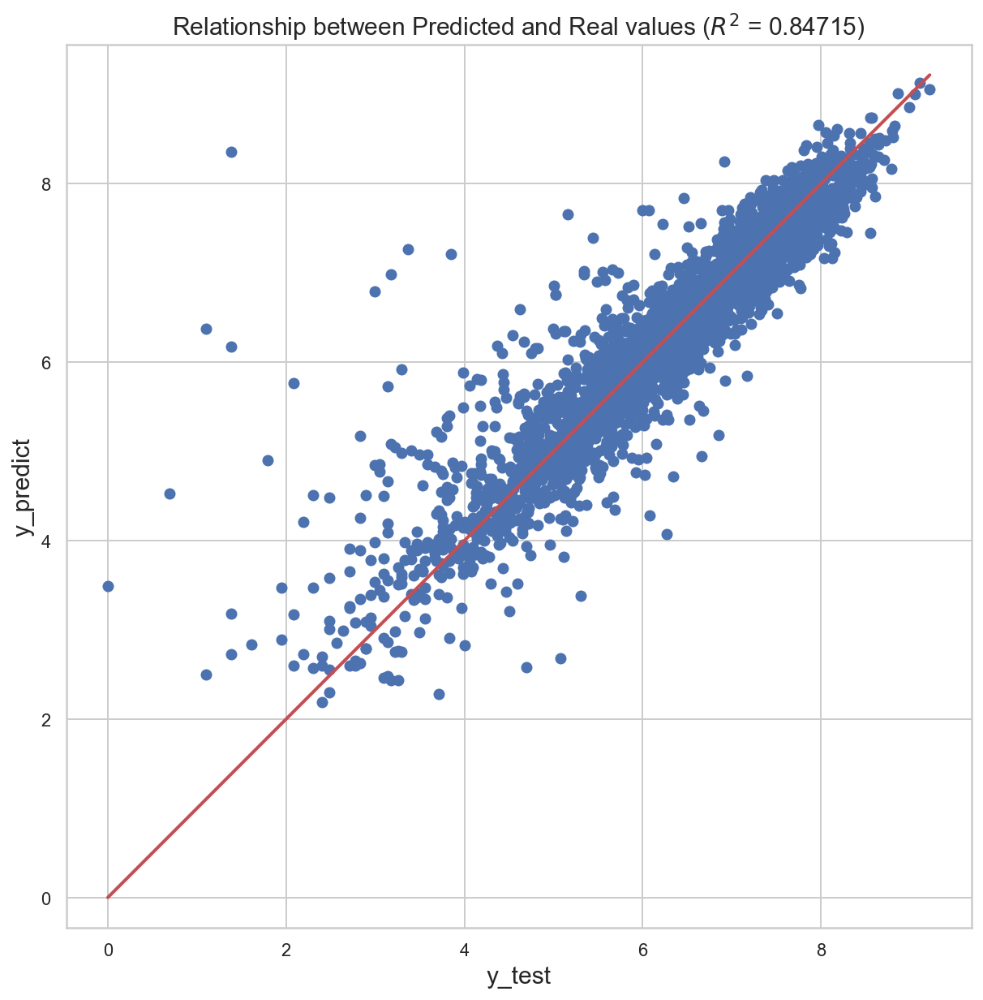

,1,2,3,4,5,mean
학습_R2,0.85201,0.84919,0.84714,0.85060,0.85161,0.85011
검증_R2,0.84390,0.85799,0.85198,0.85247,0.84715,0.85070


In [95]:
score5 = k_fold(df_train, formula, Plot=True)
score5

In [96]:
model = sm.OLS.from_formula(formula, data = df_train)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:     np.log(bike_count)   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.849
Method:                 Least Squares   F-statistic:                     1354.
Date:                Wed, 10 Jul 2019   Prob (F-statistic):               0.00
Time:                        13:06:35   Log-Likelihood:                -10698.
No. Observations:               14645   AIC:                         2.152e+04
Df Residuals:                   14583   BIC:                         2.199e+04
Df Model:                          61                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
C(cat_prec)[0]    

#### C(hour):C(weekday) 걸러내기

In [97]:
hypotheses_ls = []
for weekday in range(2):
    for hour in range(1, 24):
        hypothesis = 'C(hour)[T.{}]:C(weekday)[{}]'.format(hour, weekday)
        hypotheses_ls.append(hypothesis)


In [98]:
data = []
for hypothesis1 in hypotheses_ls:
    row = {}
    for hypothesis2 in hypotheses_ls:
        if hypothesis1 == hypothesis2:
            row[hypothesis2] = np.NaN
        else:
            hypothesis = hypothesis1 + " = " + hypothesis2
            t_test = result.t_test(hypothesis)
            p = t_test.pvalue
            row[hypothesis2] = p
    data.append(row)

In [99]:
hypo_df = pd.DataFrame(data, index = hypotheses_ls)

In [100]:
hypo_df = hypo_df[hypotheses_ls]

In [101]:
with open("data/hourly/hypo.pkl", "wb") as f:
    pickle.dump(hypo_df, f)

#### 

In [102]:
for i in range(len(hypotheses_ls)-1):
    if hypo_df.iloc[i, i+1] > 0.05:
        print("{} == {}".format(hypotheses_ls[i], hypotheses_ls[i+1]))

C(hour)[T.8]:C(weekday)[0] == C(hour)[T.9]:C(weekday)[0]
C(hour)[T.9]:C(weekday)[0] == C(hour)[T.10]:C(weekday)[0]
C(hour)[T.10]:C(weekday)[0] == C(hour)[T.11]:C(weekday)[0]
C(hour)[T.13]:C(weekday)[0] == C(hour)[T.14]:C(weekday)[0]
C(hour)[T.15]:C(weekday)[0] == C(hour)[T.16]:C(weekday)[0]
C(hour)[T.17]:C(weekday)[0] == C(hour)[T.18]:C(weekday)[0]
C(hour)[T.18]:C(weekday)[0] == C(hour)[T.19]:C(weekday)[0]
C(hour)[T.19]:C(weekday)[0] == C(hour)[T.20]:C(weekday)[0]
C(hour)[T.20]:C(weekday)[0] == C(hour)[T.21]:C(weekday)[0]
C(hour)[T.21]:C(weekday)[0] == C(hour)[T.22]:C(weekday)[0]
C(hour)[T.10]:C(weekday)[1] == C(hour)[T.11]:C(weekday)[1]
C(hour)[T.12]:C(weekday)[1] == C(hour)[T.13]:C(weekday)[1]
C(hour)[T.13]:C(weekday)[1] == C(hour)[T.14]:C(weekday)[1]


## 4.4 Test Dataset Predict

In [103]:
y_pred = result.predict(df_test)
test_R2 = sk.metrics.r2_score(df_test["bike_count"].apply(np.log), y_pred)

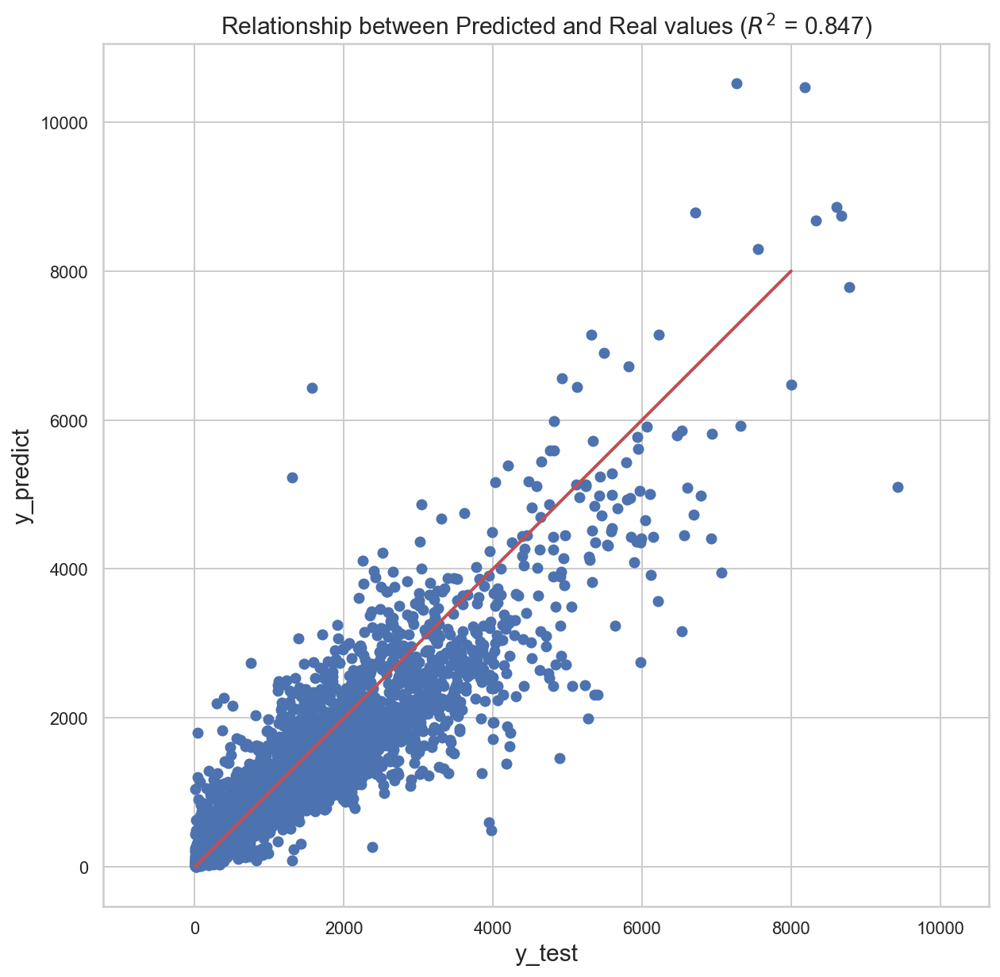

In [104]:
plt.figure(figsize = (10, 10))
plt.scatter(df_test["bike_count"], np.exp(y_pred))
plt.plot([0, 8000], [0, 8000], "r", lw=2)
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.xlabel("y_test", fontsize = 15)
plt.ylabel("y_predict", fontsize = 15)
plt.axis("equal")
plt.show()

# 5. Design Linear Regression Model: Time-series split

In [105]:
with open("../data/df_train_timeseries.pkl", "rb") as f:
    df_train_timeseries = pickle.load(f)
with open("../data/df_val_timeseries.pkl", "rb") as f:
    df_val_timeseries = pickle.load(f)
with open("../data/df_test_timeseries.pkl", "rb") as f:
    df_test_timeseries = pickle.load(f)

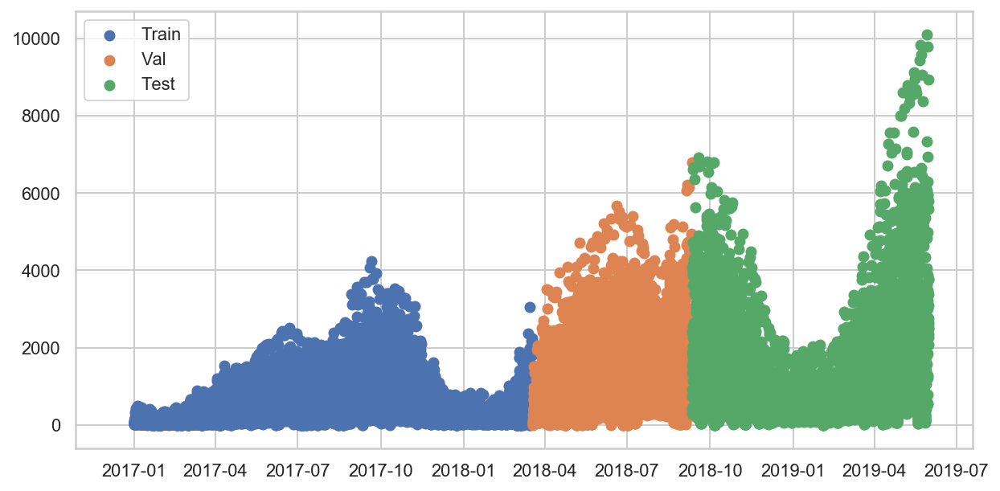

In [106]:
plt.figure(figsize = (10, 5))
plt.scatter(df_train_timeseries.index, df_train_timeseries["bike_count"], label = "Train")
plt.scatter(df_val_timeseries.index, df_val_timeseries["bike_count"], label = "Val")
plt.scatter(df_test_timeseries.index, df_test_timeseries["bike_count"], label = "Test")
plt.legend(loc = 0)
plt.show()

In [107]:
train_2017 = sm.add_constant(df_train_timeseries)
val_2017 = sm.add_constant(df_val_timeseries)
test_2017 = sm.add_constant(df_test_timeseries)

## 5.1. 모델링: PM10 not included

In [108]:
default_formula = list(map(lambda x : "scale({})".format(x), train_2017.columns[1:-1]))
default_formula_dict = dict(zip(train_2017.columns[1:-1], default_formula))
default_formula_dict["weekday"] = "C(weekday)"
default_formula_dict["hour"] = "C(hour)"
default_formula_dict["Wind_dir"] = "C(Wind_dir)"
default_formula_dict["cat_prec"] = "C(cat_prec)"
default_formula_dict["cat_snow"] = "C(cat_snow)"

In [109]:
# 딕셔너리 초기화
formula_dict = default_formula_dict.copy()

# 딕셔너리 수정
formula_dict["timestamp"] = "scale(timestamp) + scale(I(timestamp **2))"
formula_dict["hour:weekday"] = "C(hour):C(weekday)" 
formula_dict["Temp"] = "scale(Temp) + scale(Temp**2) + scale(Temp**4)"
formula_dict["Snowfall"] = "scale(np.log(I(Snowfall + 1)))"
formula_dict["O3"] = "scale(O3) + scale(O3**2)"
formula_dict["Air_pressure"] = "scale(Air_pressure)"
formula_dict["PM10"] = "scale(np.log(PM10)) + scale(I(np.log(PM10)**2))"
formula_dict["cat_prec"] = "C(cat_prec)"
formula_dict["cat_snow"] = "C(cat_snow)"
formula_dict["bike_feed"] = "scale(np.log(bike_feed))"

# 사용하고 싶은 키 빼오기
formula_use_keys = ["cat_snow", "hour:weekday", "Temp", "cat_prec", "Air_pressure", "Humidity", "bike_feed"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("np.log(bike_count) ~ " + " + ".join(formula_use_values) + "+ 0")
formula

'np.log(bike_count) ~ C(cat_snow) + C(hour):C(weekday) + scale(Temp) + scale(Temp**2) + scale(Temp**4) + C(cat_prec) + scale(Air_pressure) + scale(Humidity) + scale(np.log(bike_feed))+ 0'

In [110]:
model = sm.OLS.from_formula(formula, data = train_2017)
result = model.fit()
y_pred = result.predict(val_2017)
test_R2 = sk.metrics.r2_score(val_2017["bike_count"].apply(np.log), y_pred)
print(test_R2)

0.7800264520399534


### 검증

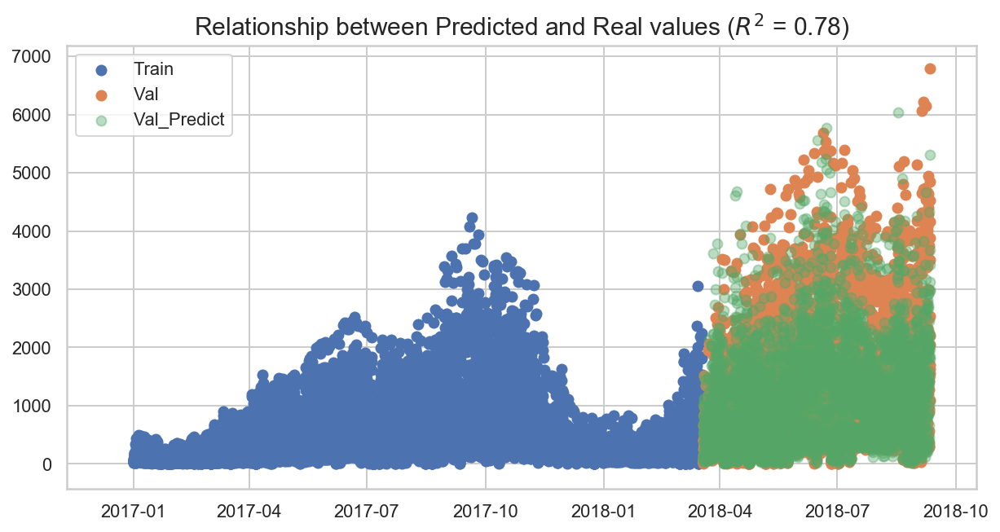

In [111]:
plt.figure(figsize = (10, 5))
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.scatter(train_2017.index, train_2017["bike_count"], label = "Train")
plt.scatter(val_2017.index, val_2017["bike_count"], label = "Val")
plt.scatter(val_2017.index, np.exp(y_pred), label = "Val_Predict", alpha = 0.4)
plt.legend(loc = 0)
plt.show()

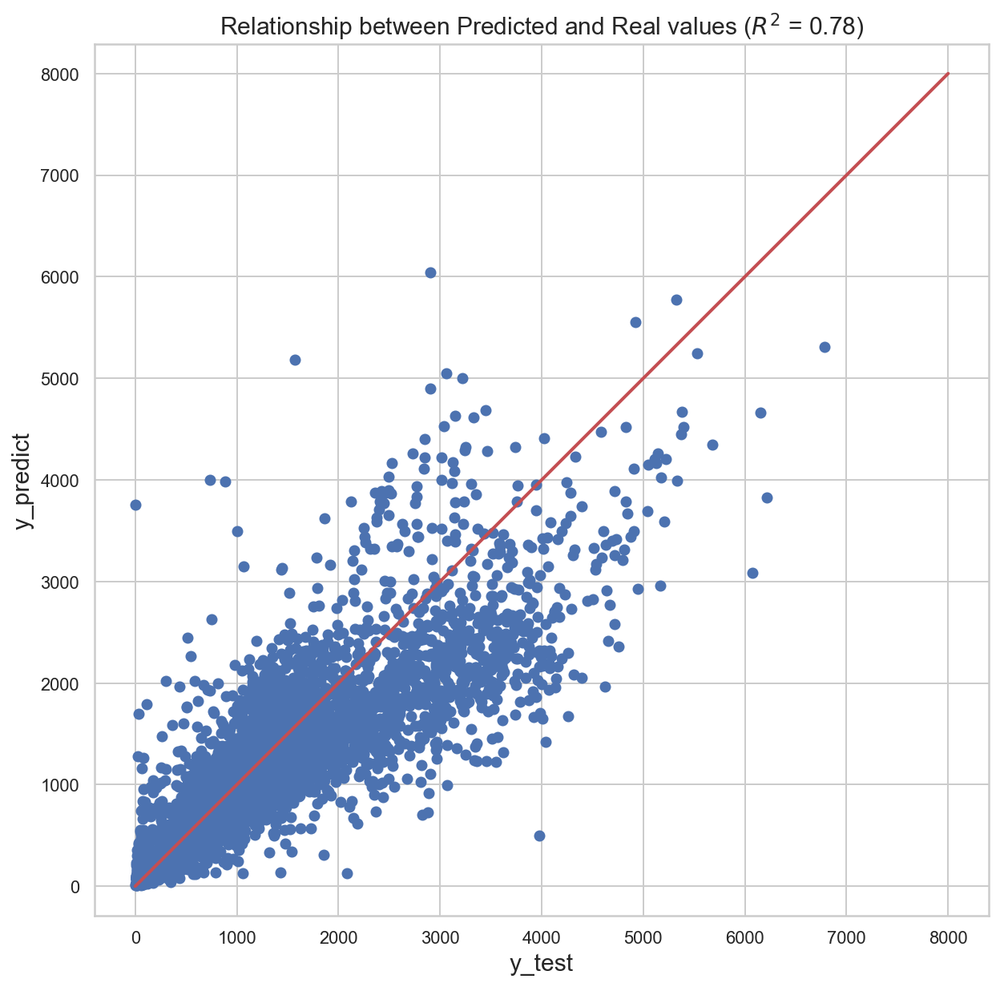

In [112]:
plt.figure(figsize = (10, 10))
plt.scatter(val_2017["bike_count"], np.exp(y_pred))
plt.plot([0, 8000], [0, 8000], "r", lw=2)
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.xlabel("y_test", fontsize = 15)
plt.ylabel("y_predict", fontsize = 15)
plt.axis("equal")
plt.show()

### 예측

In [ ]:
model = sm.OLS.from_formula(formula, data = pd.concat([train_2017, val_2017]))
result = model.fit()
y_pred = result.predict(test_2017)
test_R2 = sk.metrics.r2_score(test_2017["bike_count"].apply(np.log), y_pred)

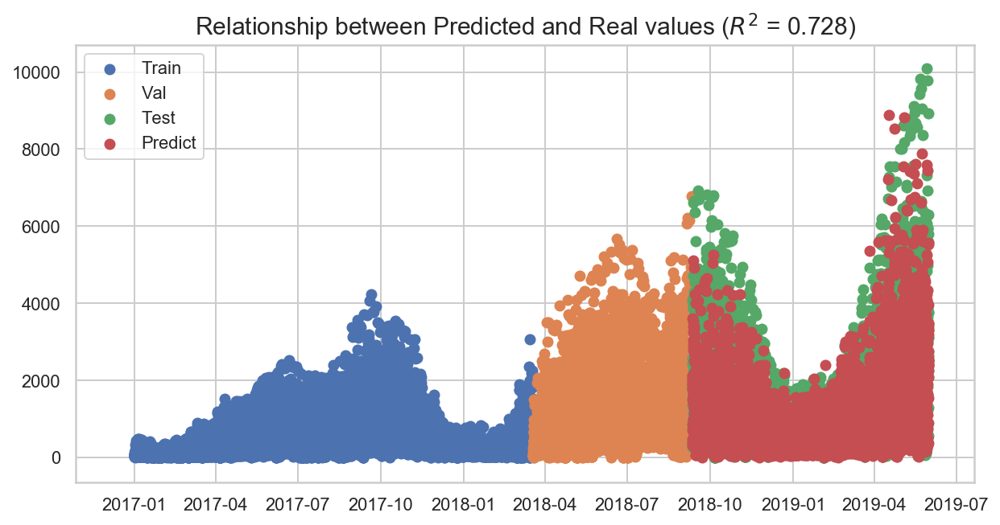

In [114]:
plt.figure(figsize = (10, 5))
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.scatter(train_2017.index, train_2017["bike_count"], label = "Train")
plt.scatter(val_2017.index, val_2017["bike_count"], label = "Val")
plt.scatter(test_2017.index, test_2017["bike_count"], label = "Test")
plt.scatter(test_2017.index, np.exp(y_pred), label = "Predict")
plt.legend(loc = 0)
plt.show()

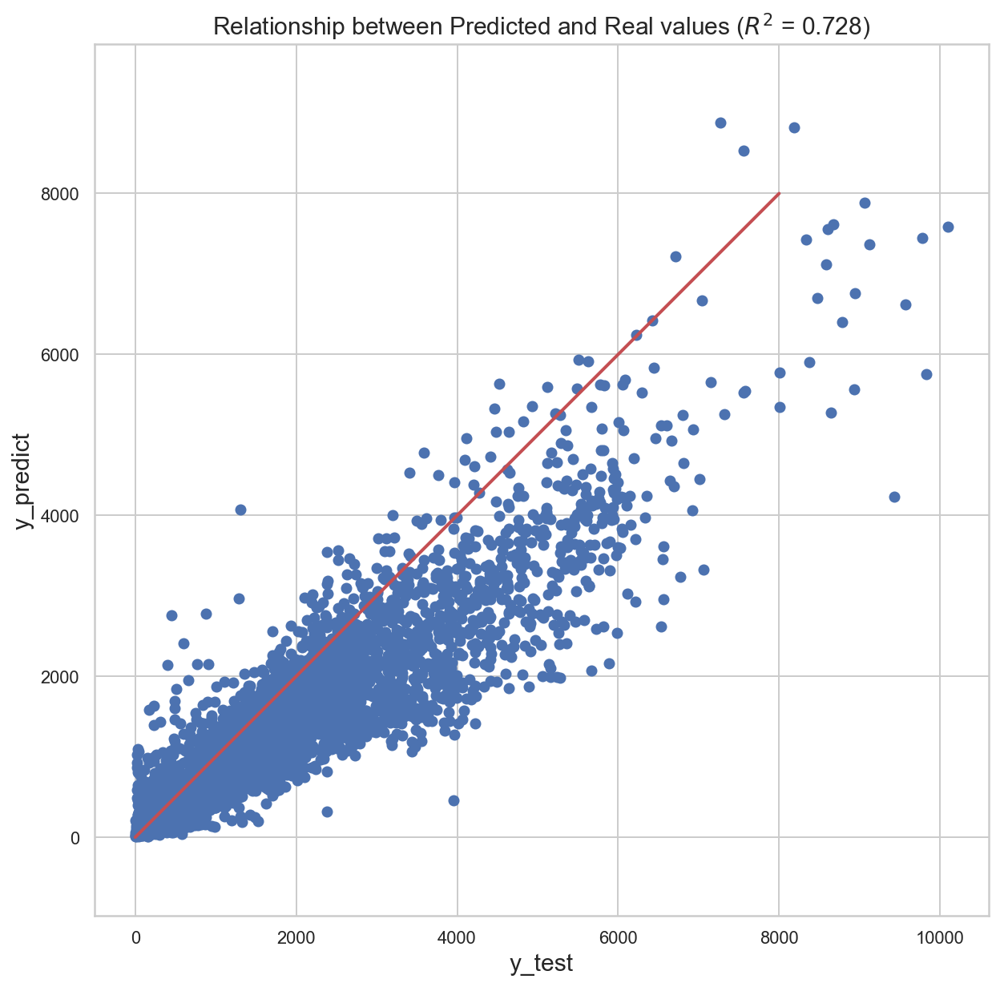

In [115]:
plt.figure(figsize = (10, 10))
plt.scatter(test_2017["bike_count"], np.exp(y_pred))
plt.plot([0, 8000], [0, 8000], "r", lw=2)
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.xlabel("y_test", fontsize = 15)
plt.ylabel("y_predict", fontsize = 15)
plt.axis("equal")
plt.show()

## 5.2. 모델링: PM10 included

In [116]:
default_formula = list(map(lambda x : "scale({})".format(x), train_2017.columns[1:-1]))
default_formula_dict = dict(zip(train_2017.columns[1:-1], default_formula))
default_formula_dict["weekday"] = "C(weekday)"
default_formula_dict["hour"] = "C(hour)"
default_formula_dict["Wind_dir"] = "C(Wind_dir)"
default_formula_dict["cat_prec"] = "C(cat_prec)"
default_formula_dict["cat_snow"] = "C(cat_snow)"

In [117]:
# 딕셔너리 초기화
formula_dict = default_formula_dict.copy()

# 딕셔너리 수정
formula_dict["timestamp"] = "scale(timestamp) + scale(I(timestamp **2))"
formula_dict["hour:weekday"] = "C(hour):C(weekday)" 
formula_dict["Temp"] = "scale(Temp) + scale(Temp**2) + scale(Temp**4)"
formula_dict["Snowfall"] = "scale(np.log(I(Snowfall + 1)))"
formula_dict["O3"] = "scale(O3) + scale(O3**2)"
formula_dict["Air_pressure"] = "scale(Air_pressure)"
formula_dict["PM10"] = "scale(np.log(PM10)) + scale(I(np.log(PM10)**2))"
formula_dict["cat_prec"] = "C(cat_prec)"
formula_dict["cat_snow"] = "C(cat_snow)"
formula_dict["bike_feed"] = "scale(np.log(bike_feed))"

# 사용하고 싶은 키 빼오기
formula_use_keys = ["cat_snow", "hour:weekday", "Temp", "cat_prec", "Air_pressure", "Humidity", "bike_feed", "PM10"]
formula_use_values = [formula_dict[x] for x in formula_use_keys]
formula = ("np.log(bike_count) ~ " + " + ".join(formula_use_values) + "+ 0")
formula

'np.log(bike_count) ~ C(cat_snow) + C(hour):C(weekday) + scale(Temp) + scale(Temp**2) + scale(Temp**4) + C(cat_prec) + scale(Air_pressure) + scale(Humidity) + scale(np.log(bike_feed)) + scale(np.log(PM10)) + scale(I(np.log(PM10)**2))+ 0'

In [118]:
model = sm.OLS.from_formula(formula, data = train_2017)
result = model.fit()
y_pred = result.predict(val_2017)
test_R2 = sk.metrics.r2_score(val_2017["bike_count"].apply(np.log), y_pred)
print(test_R2)

0.7813555892463472


### 검증

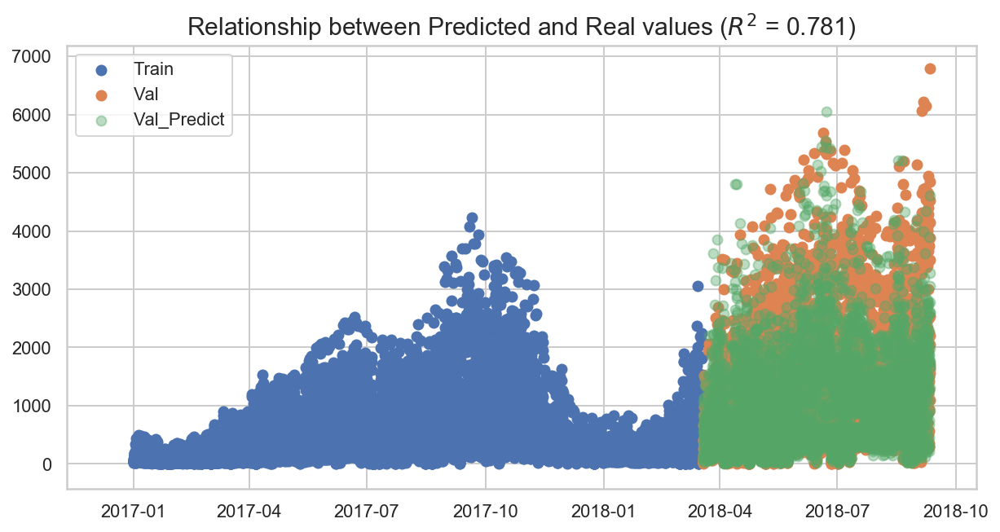

In [119]:
plt.figure(figsize = (10, 5))
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.scatter(train_2017.index, train_2017["bike_count"], label = "Train")
plt.scatter(val_2017.index, val_2017["bike_count"], label = "Val")
plt.scatter(val_2017.index, np.exp(y_pred), label = "Val_Predict", alpha = 0.4)
plt.legend(loc = 0)
plt.show()

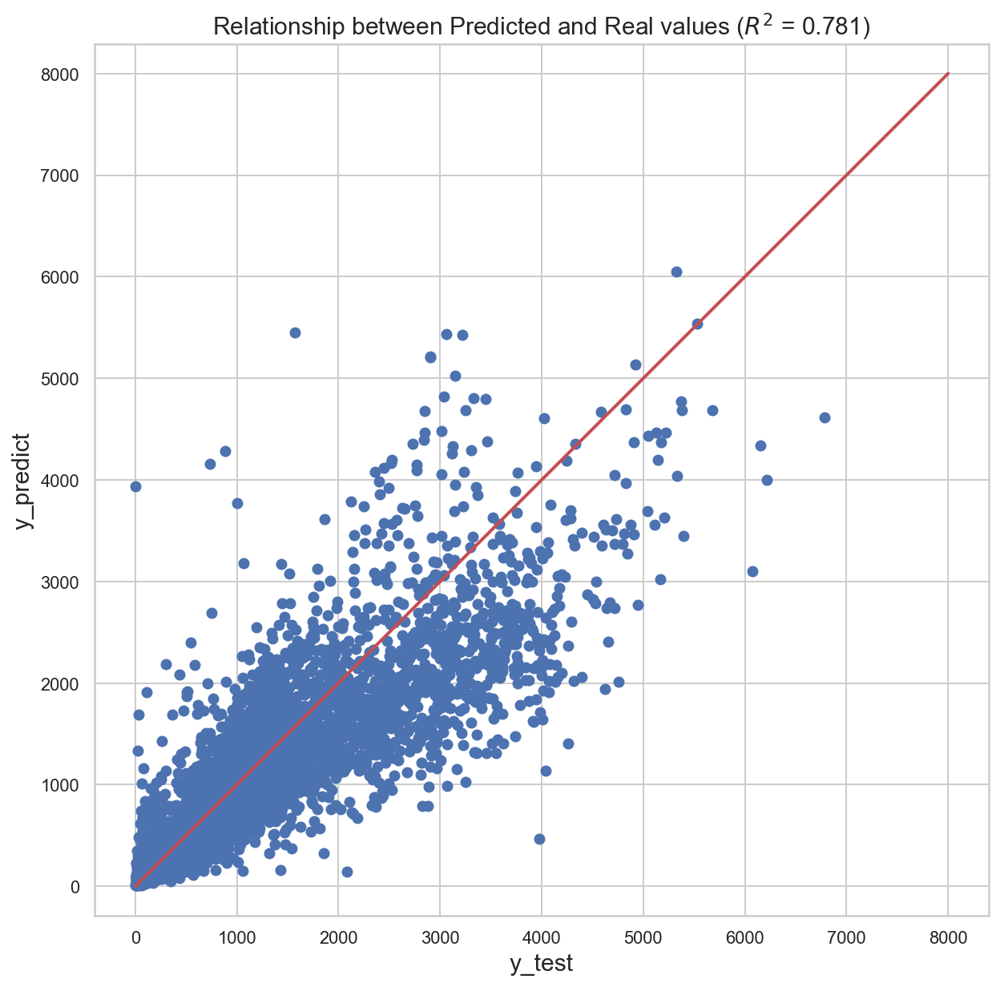

In [120]:
plt.figure(figsize = (10, 10))
plt.scatter(val_2017["bike_count"], np.exp(y_pred))
plt.plot([0, 8000], [0, 8000], "r", lw=2)
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.xlabel("y_test", fontsize = 15)
plt.ylabel("y_predict", fontsize = 15)
plt.axis("equal")
plt.show()

### 예측

In [121]:
model = sm.OLS.from_formula(formula, data = pd.concat([train_2017, val_2017]))
result = model.fit()
y_pred = result.predict(test_2017)
test_R2 = sk.metrics.r2_score(test_2017["bike_count"].apply(np.log), y_pred)

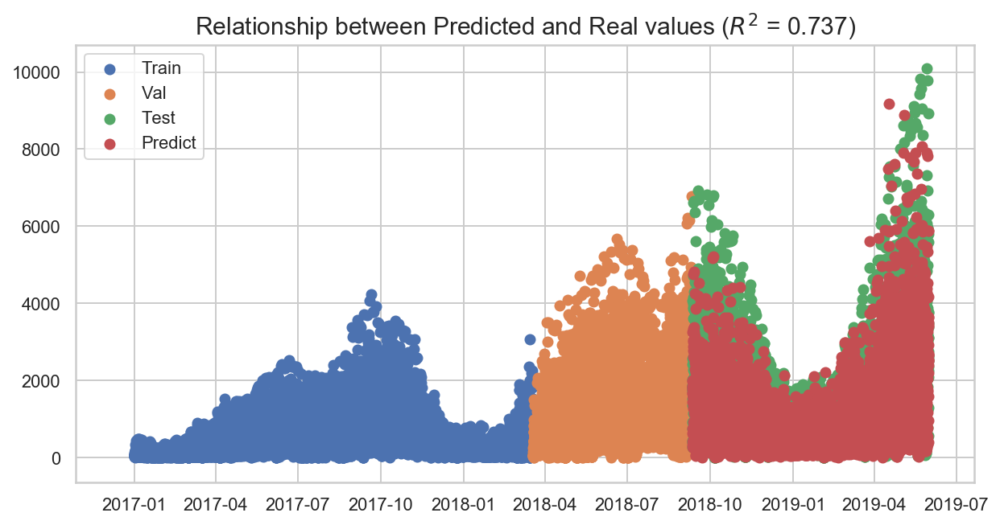

In [122]:
plt.figure(figsize = (10, 5))
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.scatter(train_2017.index, train_2017["bike_count"], label = "Train")
plt.scatter(val_2017.index, val_2017["bike_count"], label = "Val")
plt.scatter(test_2017.index, test_2017["bike_count"], label = "Test")
plt.scatter(test_2017.index, np.exp(y_pred), label = "Predict")
plt.legend(loc = 0)
plt.show()

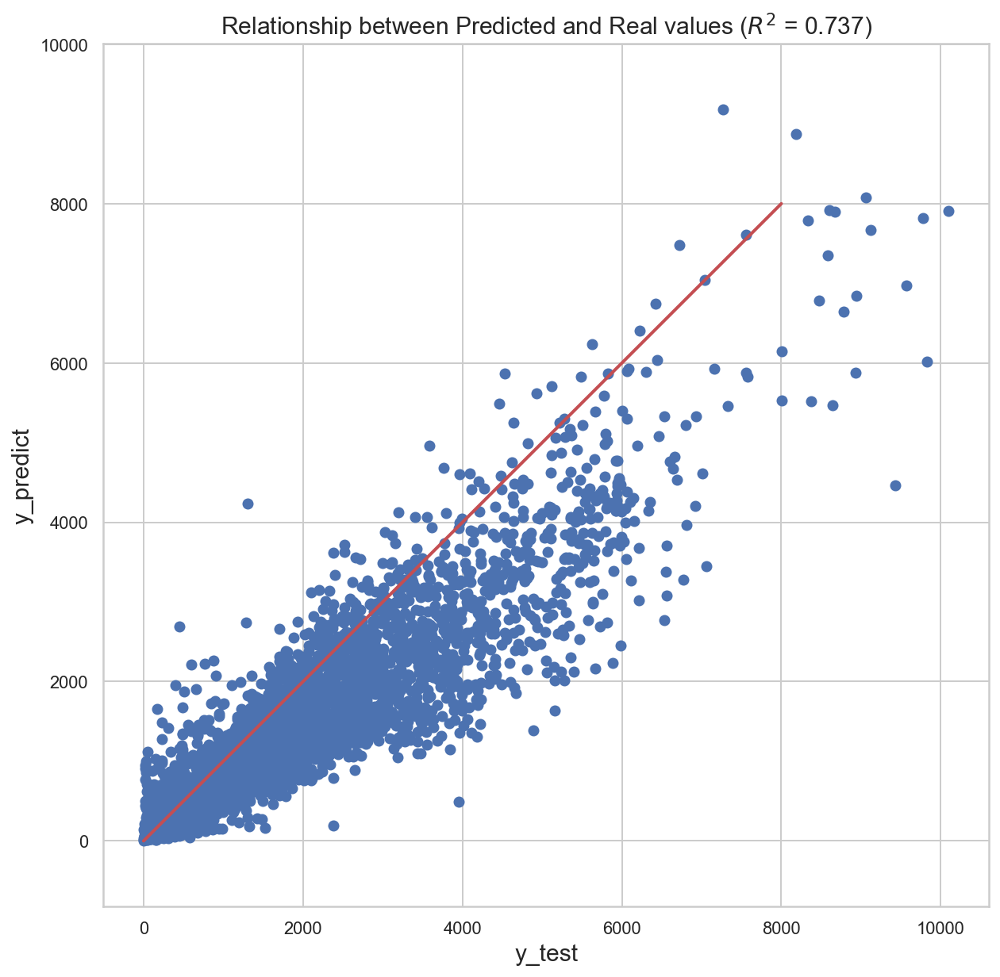

In [123]:
plt.figure(figsize = (10, 10))
plt.scatter(test_2017["bike_count"], np.exp(y_pred))
plt.plot([0, 8000], [0, 8000], "r", lw=2)
plt.title("Relationship between Predicted and Real values ($R^2$ = {})".format(round(test_R2, 3)), fontsize = 15)
plt.xlabel("y_test", fontsize = 15)
plt.ylabel("y_predict", fontsize = 15)
plt.axis("equal")
plt.show()

# 6. 제언
- 장기적인 트렌드를 예측하기 어려움(Test dataset에서 실제값보다 전반적으로 작게 예측되는 경향을 보임)
    - 추후에 장기적인 트렌드를 예측하기 위한 개선된 모델링 제안
- 따릉이의 도입이 약 4년 / 유의미한 데이터의 양이 2년 5개월이고, 미세먼지는 상대적으로 최근에 부각된 이슈임
    - 추후 수집되는 데이터로 학습 데이터의 양을 늘려서 분석할 것을 제안
- 추후 고려 가능한 추가 메타데이터 
    - 신규가입자수
    - 정기/비정기 이용자 데이터 셋
    - 도로, 주거, 대여소 등에 관한 공간해상도 feature를 분석하면 더욱 좋은 결과가 나올 것으로 예측됨

# 7. 참고문헌
- 서울시설공단(2018) 공공자전거 종합현황
- 임희종, 정광헌(2019) 서울시공유자전거의수요예측모델개발, 한국콘텐츠학회논문지, 19(1), 132-140
- 이장호, 정경옥, 신희철(2016). 기상조건과 입지특성이 공공자전거 이용에 미치는 영향 분석, 대한교통학회지, 34(5), 394-408.
- Fishman E., Washington S., Haworth N., Watson A. (2015), Factors Influencing Bike Share Membership: An Analysis of Melbourne and Brisbane, Transportation Research Part A, 71, 17-30.
- Andrew A., Christopher R., Megan S., Xinmiao Y. (2016), Factors influencing the choice of shared bicycles and shared, Transportation Research Part C, 67, 399-414.
- Ran A., Renee Z., Dorina P., Jonathan C. (2019). Weather and cycling in New York: The case of Citibike, Journal of Transport Geography, 77, 97-112.
- 장펑린, 최막중(2019) 미세먼지가 옥외 여가활동에 미치는 영향, 대한국토도시계획학회,  53(3), 133-143
- 송길영 (2018) 미세먼지에서 살아남기 - 빅데이터로 본  미세먼지, 다음소프트, http://www.daumsoft.com/article/252?pageNum=4&category=selection
- Da Zhang, Mansur R. (2018). Combining Weather Condition Data to Predict Traffic Flow: A GRU Based Deep Learning Approach,  IET Intelligent Transport System, 12(7), 578-585.
- Jeffrey D., Lisa A. Hendricks, Sergio G., Marcus R., Subhashini V., Kate S., Trevor D. (2015). Long-term Recurrent Convolutional Networks for Visual Recognition and Description. The IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2625-2634.
